In [1]:
import os
# from utils.eval import plot_performance
import data_loader.gw_dataloader as data_loader_module
import models.gw_models as models_module
from utils.config import process_config, init_obj
from pycbc.filter.matchedfilter import match
from pycbc.types import TimeSeries
from tqdm import tqdm
import numpy as np

def load_model_and_data_loader(model_dir):
    
    config, _ = process_config(os.path.join(model_dir, "config.json"))
    data_loader = init_obj(config, "data_loader", data_loader_module)

    if config.model.name == "RegularizedAutoEncoderGenerator":
        model = init_obj(config, "model", models_module, data_loader = data_loader, inference = True)
    else:
        model = init_obj(config, "model", models_module, data_loader = data_loader)

    model.load(os.path.join(model_dir, "best_model.hdf5"))

    return model.model, data_loader

def pycbc_mismatch(y_pred, y_true, delta_t, real = True):

    '''
    delta_t must be in seconds
    '''

    mm = []
    for prd, grnd in tqdm(zip(y_pred, y_true), total = len(y_pred), desc = "Calculating mismatches"):
        if real:
            pred_ts = TimeSeries(np.real(prd).astype(float), delta_t)
            grnd_ts = TimeSeries(np.real(grnd).astype(float), delta_t)
        else:
            pred_ts = TimeSeries(np.imag(prd).astype(float), delta_t)
            grnd_ts = TimeSeries(np.imag(grnd).astype(float), delta_t)
        mm.append(1-match(pred_ts, grnd_ts)[0])
    
    return np.array(mm), np.argmin(mm), np.argmax(mm)


import matplotlib.pyplot as plt

def plot_performance(y_pred, y_true, delta_t):
    mm_score = []


    mm_score, _, _ = pycbc_mismatch(y_pred, y_true, delta_t)


    plt.hist(np.log10(mm_score), bins = 40, range = (min(np.log10(mm_score))-0.5, max(np.log10(mm_score))+0.5))
    plt.title('Mean: ' + str(np.mean(mm_score)))
    plt.ylabel('Count')
    plt.xlabel('$\log_{10}$ mismatch')

    mm_score = np.array(mm_score)
    args = np.argsort(mm_score)
    best_scores = mm_score[args][-4:]
    worst_scores = mm_score[args][:4]

    good_idx = [ct for ct, i in enumerate(mm_score) if i in best_scores]
    bad_idx = [ct for ct, i in enumerate(mm_score) if i in worst_scores]

    fig, ax = plt.subplots(2, 4)

    idx = good_idx[:4] + bad_idx[:4]

    ax[0, 0].plot(y_true[idx[0]], label = 'Original')
    ax[0, 0].plot(y_pred[idx[0]], label = 'Predicted')
    ax[0, 0].title.set_text('Mismatch: ' + str(mm_score[idx[0]]))
    ax[0, 0].legend()

    ax[0, 1].plot(y_true[idx[1]])
    ax[0, 1].plot(y_pred[idx[1]])
    ax[0, 1].title.set_text('Mismatch: ' + str(mm_score[idx[1]]))

    ax[0, 2].plot(y_true[idx[2]])
    ax[0, 2].plot(y_pred[idx[2]])
    ax[0, 2].title.set_text('Mismatch: ' + str(mm_score[idx[2]]))

    ax[0, 3].plot(y_true[idx[3]])
    ax[0, 3].plot(y_pred[idx[3]])
    ax[0, 3].title.set_text('Mismatch: ' + str(mm_score[idx[3]]))

    ax[1, 0].plot(y_true[idx[4]])
    ax[1, 0].plot(y_pred[idx[4]])
    ax[1, 0].title.set_text('Mismatch: ' + str(mm_score[idx[4]]))

    ax[1, 1].plot(y_true[idx[5]])
    ax[1, 1].plot(y_pred[idx[5]])
    ax[1, 1].title.set_text('Mismatch: ' + str(mm_score[idx[5]]))

    ax[1, 2].plot(y_true[idx[6]])
    ax[1, 2].plot(y_pred[idx[6]])
    ax[1, 2].title.set_text('Mismatch: ' + str(mm_score[idx[6]]))

    ax[1, 3].plot(y_true[idx[7]])
    ax[1, 3].plot(y_pred[idx[7]])
    ax[1, 3].title.set_text('Mismatch: ' + str(mm_score[idx[7]]))

    fig.set_size_inches(20, 9.5)

    return mm_score, good_idx, bad_idx


2024-05-07 12:56:38.348785: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-07 12:56:38.509695: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-07 12:56:39.335429: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/nino/miniconda3/envs/Tensorflow/lib/
2024-05-07 12:56:39.335516: W tensorflow/co

In [2]:
import tensorflow as tf
cpu = True

# if cpu:
#     os.environ["CUDA_VISIBLE_DEVICES"]=''
# else:
#     gpus = tf.config.experimental.list_physical_devices('GPU')
#     for gpu in gpus:
#         tf.config.experimental.set_memory_growth(gpu, True)

if cpu:
  os.environ["CUDA_VISIBLE_DEVICES"]=""
else:
  gpus = tf.config.experimental.list_physical_devices('GPU')
  if gpus:
    try:
      tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=10000)])
    except RuntimeError as e:
      print(e)

In [3]:
def pycbc_mismatch(y_pred, y_true, delta_t, real = True):

    '''
    delta_t must be in seconds
    '''

    mm = []
    for prd, grnd in zip(y_pred, y_true):
        if real:
            pred_ts = TimeSeries(np.real(prd).astype(float), delta_t)
            grnd_ts = TimeSeries(np.real(grnd).astype(float), delta_t)
        else:
            pred_ts = TimeSeries(np.imag(prd).astype(float), delta_t)
            grnd_ts = TimeSeries(np.imag(grnd).astype(float), delta_t)
        mm.append(1-match(pred_ts, grnd_ts)[0])
    
    return np.array(mm), np.argmin(mm), np.argmax(mm)

def get_data(par, y, N):
    z_samples = np.random.normal(0, 1, (N, 10))
    pars = np.tile(par, (N, 1))
    y_ground = np.tile(y, (N, 1))

    return z_samples, pars, y_ground

def plot_mean_distribution(dec, y_ground, pars, N, delta_t, dir, train):

    if not os.path.isdir(dir):
       os.mkdir(dir)

    means = []
    for par, y in tqdm(zip(pars, y_ground), total = len(y_ground), desc = "Getting distribution of means"):
        z_samples, params, y_target = get_data(par, y, N)
        y_pred = dec.predict([z_samples, params], batch_size = np.floor(N/10).astype(int), verbose = 0)
        mismatch, _, _ = pycbc_mismatch(y_pred, y_target, delta_t, real = True)
        means.append(np.mean(mismatch))
    
    
    bins = np.logspace(np.log10(min(means)), np.log10(max(means)), num=30)
    plt.hist(means, bins = bins)
    plt.title(f"Distribution of means for cVAE generator\nMean of means: {np.mean(means):.3e}")
    plt.grid(True, which="both", axis="both", linestyle='-', color='gray', linewidth=0.5, alpha = 0.7)
    plt.xscale('log')
    plt.ylabel("Count")
    plt.xlabel("Mismatch mean")
    if train:
      opt_dir_plot = os.path.join(dir, "train_mismatch_comparison.jpg")
      opt_dir_mm = os.path.join(dir, "mean_train_mismatches.bin")

      dump(np.array(means), opt_dir_mm)
      plt.savefig(opt_dir_plot)
    else:
      opt_dir_plot = os.path.join(dir, "test_mismatch_comparison.jpg")
      opt_dir_mm = os.path.join(dir, "mean_test_mismatches.bin")

      dump(np.array(means), opt_dir_mm)
      plt.savefig(opt_dir_plot)


In [12]:
z_samples, pars, ground_t = get_data(f_qzp['parameters'][0], np.real(f_qzp['waveforms'][0]), 200)
pars.shape

(200, 7)

In [7]:
print(f"Mass ratio {pars[0]:.2f}   ")

TypeError: unsupported format string passed to numpy.ndarray.__format__

4/4 [==============================] - 0s 49ms/step


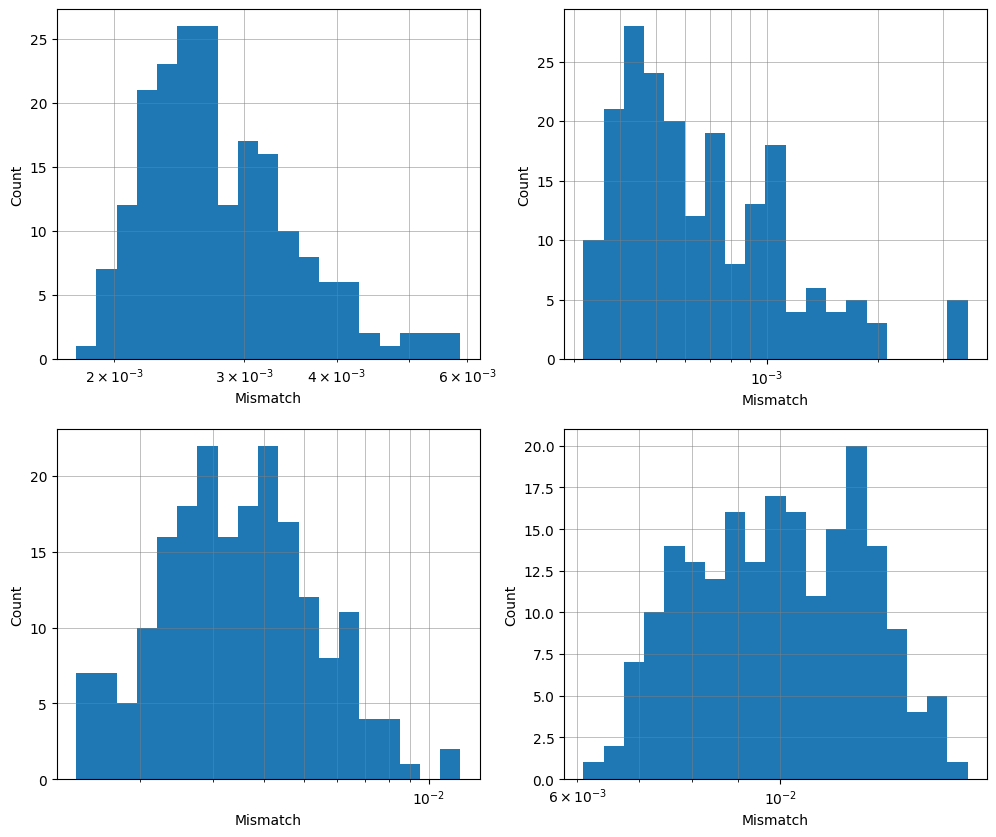

In [14]:
from keras.models import load_model
import h5py
import matplotlib.pyplot as plt

dec = load_model("/home/nino/GW/Keras-Project-Template/experiments/cvae/decoder_cvae")
f_qzp = h5py.File("/home/nino/GW/data/bbh_qzp_data.hdf5")

fig, ax = plt.subplots(2, 2)

for idx, ax1, ax2 in zip((0, 10, 20, 30), (0, 0, 1, 1), (0, 1, 0, 1)):
    
    z_samples, pars, ground_t = get_data(f_qzp['parameters'][idx], np.real(f_qzp['waveforms'][idx]), 200)
    y_pred = dec.predict([z_samples, pars], batch_size = 50)
    mm, _, _ = pycbc_mismatch(y_pred, ground_t, f_qzp['waveforms'].attrs['delta_t_seconds'])

    bins = np.logspace(np.log10(min(mm)), np.log10(max(mm)), num=20)
    _=ax[ax1, ax2].hist(mm, bins = bins)
    ax[ax1, ax2].grid(True, which="both", axis="both", linestyle='-', color='gray', linewidth=0.5, alpha = 0.7)
    ax[ax1, ax2].set_xscale('log')
    # ax[ax1, ax2].set_title(f"Mass ratio {pars[0][0]:.2f}   " + "$\\vec{\chi}_1 = $" + f"({pars[0][1]:.2f}, {pars[0][2]:.2f}, {pars[0][3]:.2f})   " + "$\\vec{\chi}_2 = $" + f"({pars[0][4]:.2f}, {pars[0][5]:.2f}, {pars[0][6]:.2f})")
    ax[ax1, ax2].set_xlabel("Mismatch")
    ax[ax1, ax2].set_ylabel("Count")
fig.set_size_inches((12, 10))


In [1]:
import h5py
import matplotlib.pyplot as plt

f_sxs = h5py.File("/home/nino/GW/data/sxs_clean.h5")

# f_qz = h5py.File("/home/nino/GW/data/bbh_qz_data.hdf5")
f_bns = h5py.File("/home/nino/GW/data/bns_mass_lbd.hdf")

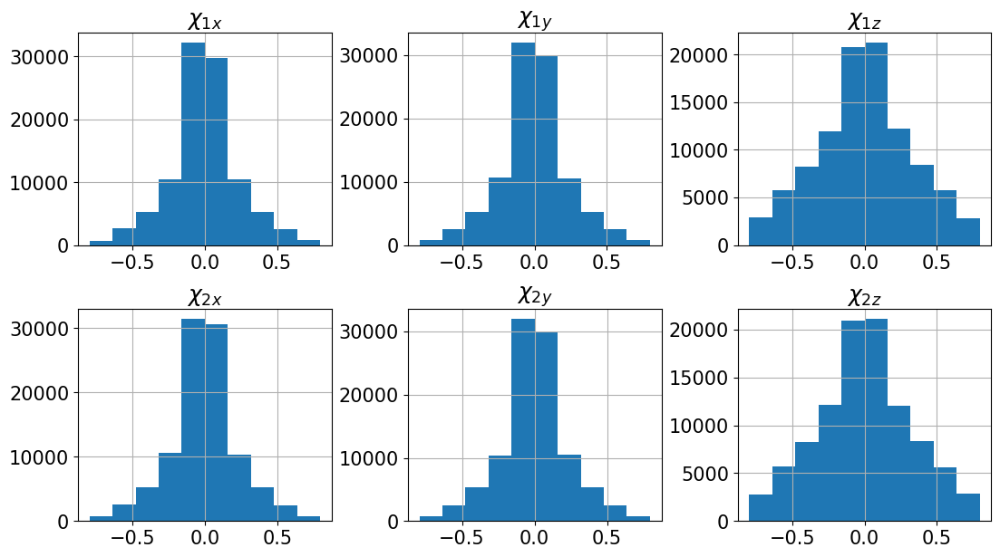

In [15]:
import seaborn as sns 
import pandas as pd
import matplotlib

names = ['Mass ratio', '$\chi_{1x}$', '$\chi_{1y}$', '$\chi_{1z}$', '$\chi_{2x}$', '$\chi_{2y}$', '$\chi_{2z}$']


# sns.pairplot(pd.DataFrame(f_qzp['parameters'][:], columns=names), corner=True)
# plt.title("Rectangular component spin distribution")
matplotlib.rc('font', size=15)
_=pd.DataFrame(f_qzp['parameters'][:, 1:], columns=names[1:]).hist(figsize=(13, 7), layout=(2, 3))


Text(0.5, 1.0, 'Tidal deformability ($\\lambda_2$)')

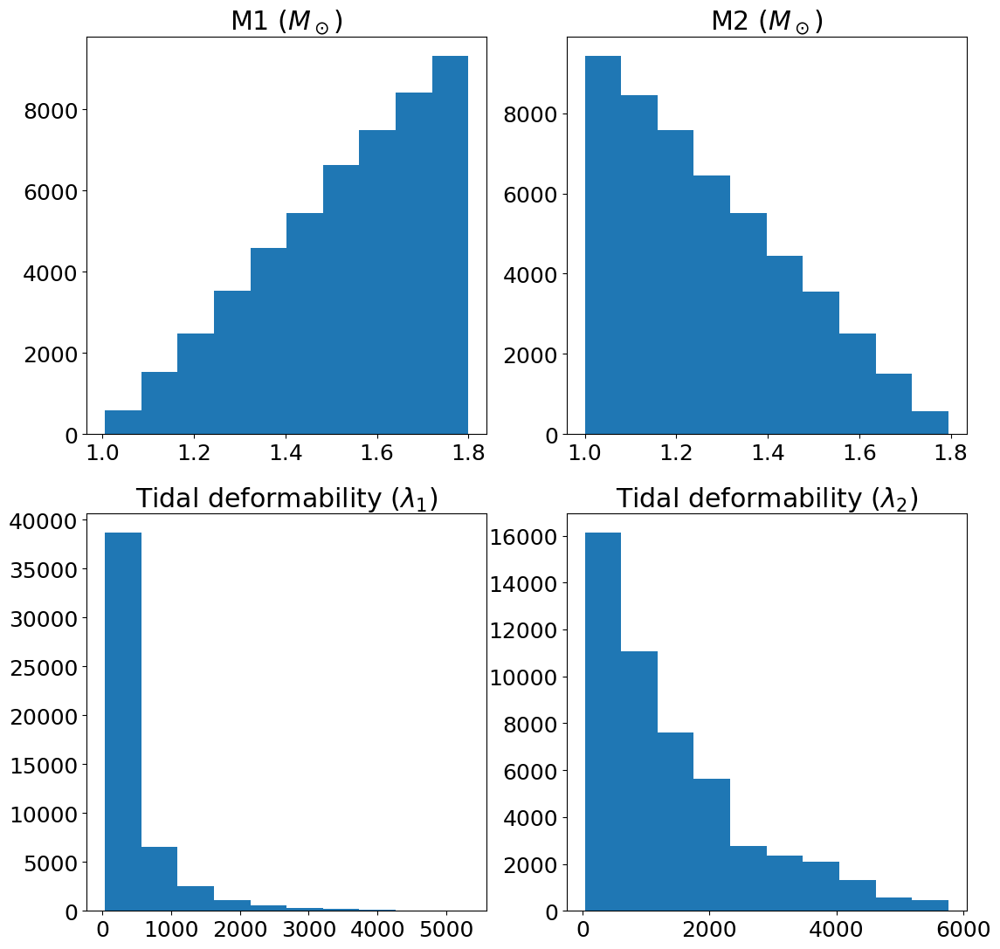

In [15]:
import matplotlib

matplotlib.rc('font', size=18)
plt.rcParams["figure.figsize"] = (13,13)

fig, ax = plt.subplots(2, 2)

ax[0, 0].hist(f_qzp['parameters'][:, 0])
ax[0, 0].set_title("Mass ratio")

ax[0, 1].hist(f_qzp['parameters'][:, 1])
ax[0, 1].set_title("M2 ($M_\odot$)")

ax[1, 0].hist(f_qzp['parameters'][:, 2])
ax[1, 0].set_title("Tidal deformability ($\lambda_1$)")

ax[1, 1].hist(f_qzp['parameters'][:, 3])
ax[1, 1].set_title("Tidal deformability ($\lambda_2$)")

In [4]:
model_dir = "/home/nino/GW/Keras-Project-Template/experiments/reg_qzp_bbh_good/reg_qzp_bbh/checkpoints"

config, _ = process_config(os.path.join(model_dir, "config.json"))
data_loader = init_obj(config, "data_loader", data_loader_module)

model = init_obj(config, "model", models_module, data_loader = data_loader, inference = True)
model.load(os.path.join(model_dir, "best_model.hdf5"))

2024-05-07 06:14:34.681401: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:267] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2024-05-07 06:14:34.681480: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: astrea
2024-05-07 06:14:34.681489: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: astrea
2024-05-07 06:14:34.681666: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:200] libcuda reported version is: 470.239.6
2024-05-07 06:14:34.681695: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:204] kernel reported version is: 470.239.6
2024-05-07 06:14:34.681701: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:310] kernel version seems to match DSO: 470.239.6
2024-05-07 06:14:34.682203: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI D

Loading model checkpoint /home/nino/GW/Keras-Project-Template/experiments/reg_qzp_bbh_good/reg_qzp_bbh/checkpoints/best_model.hdf5 ...

Model loaded


In [14]:
%%timeit
bs = 128
_=model.model.predict(data_loader.X_train[:1000], batch_size = bs, verbose = 0)

4.69 s ± 571 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


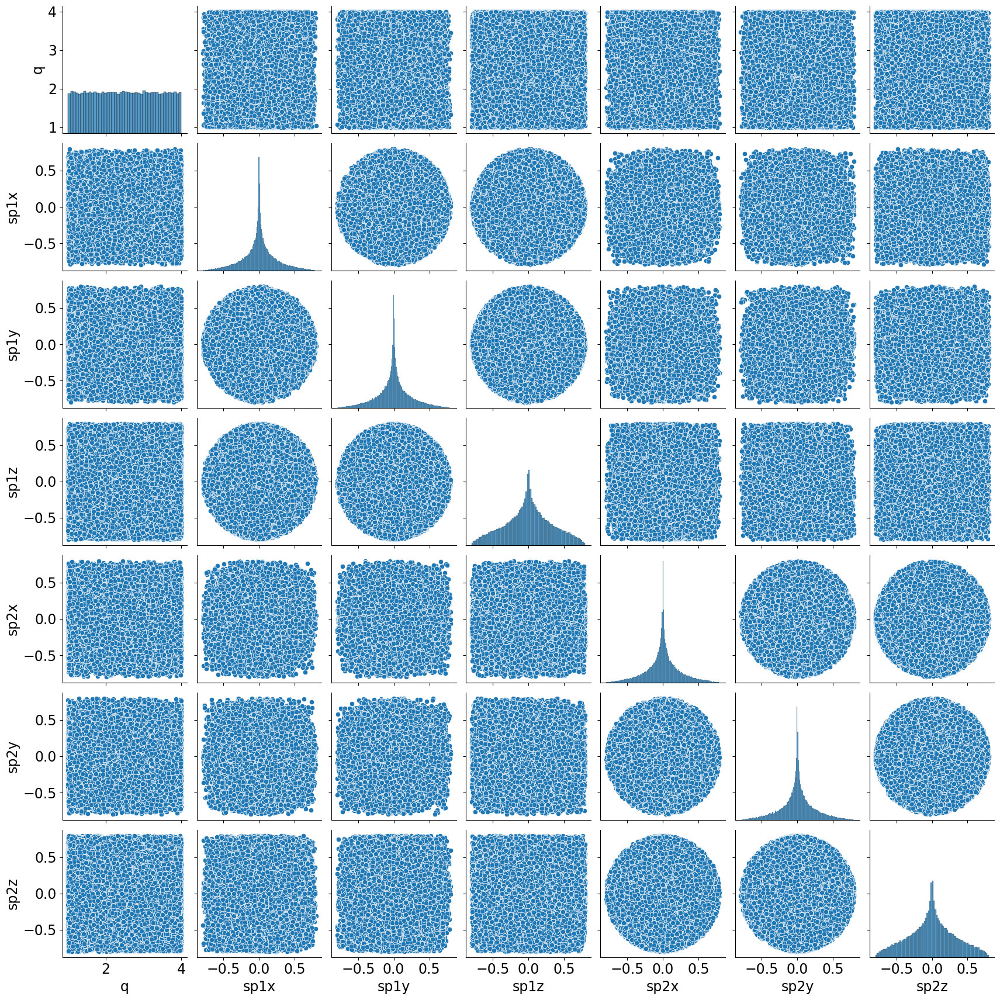

In [5]:
import seaborn as sns
import pandas as pd

sns.pairplot(pd.DataFrame(data_loader.X_train, columns = ["q", "sp1x", "sp1y", "sp1z", "sp2x", "sp2y", "sp2z"]))

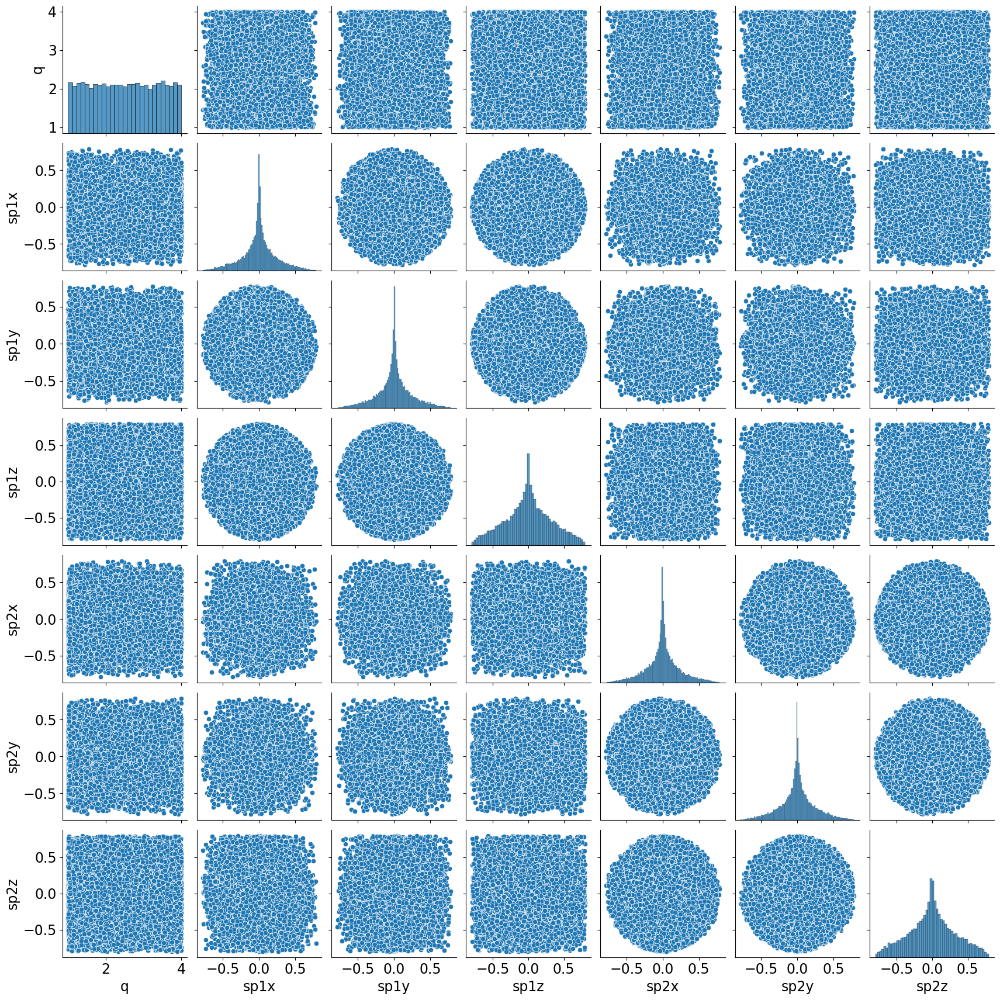

In [6]:
sns.pairplot(pd.DataFrame(data_loader.X_test, columns = ["q", "sp1x", "sp1y", "sp1z", "sp2x", "sp2y", "sp2z"]))

In [8]:
from h5py import File
from utils.utils import load_sxs_data
from utils.plot_utils import plot_mismatch_histogram, plot_waveform_comparison, get_percentile_index, make_plotting_dirs
from joblib import dump

f = File("/home/nino/GW/data/sxs_clean.h5")

delta_t_seconds = f['waveforms'].attrs['delta_t_seconds']

model.model.load_weights("/home/nino/GW/Keras-Project-Template/experiments/sxs/best_model.hdf5")
save_dir = "/home/nino/GW/Keras-Project-Template/figures/reg_tl_sxs"

x_train, y_train, x_test, y_test = load_sxs_data(700)
y_train = np.real(y_train)
y_test = np.real(y_test)

y_pred_tr = model.model.predict(x_train, batch_size=128)
y_pred_ts = model.model.predict(x_test, batch_size=128)

mm_tr, bst_tr, wrst_tr = pycbc_mismatch(y_pred_tr, y_train, delta_t_seconds)
mm_ts, bst_ts, wrst_ts = pycbc_mismatch(y_pred_ts, y_test, delta_t_seconds)

dump(mm_tr, os.path.join(save_dir, "mismatches_train.bin"))
dump(mm_ts, os.path.join(save_dir, "mismatches_test.bin"))

dir_tr, dir_ts = make_plotting_dirs(save_dir)

perc_10_tr = get_percentile_index(mm_tr, 0.9)
perc_50_tr = get_percentile_index(mm_tr, 0.5)

perc_10_ts = get_percentile_index(mm_ts, 0.9)
perc_50_ts = get_percentile_index(mm_ts, 0.5)

plot_mismatch_histogram(mm_tr, dir_tr, train = True)
plot_mismatch_histogram(mm_ts, dir_ts, train = False)

plot_waveform_comparison(y_pred_tr[bst_tr], y_train[bst_tr], delta_t_seconds, dir_tr, title = f"Best train case. Mismatch: {mm_tr[bst_tr]:.3e}", save_name = "best_waveform.jpg")
plot_waveform_comparison(y_pred_ts[bst_ts], y_test[bst_ts], delta_t_seconds, dir_ts, title = f"Best test case. Mismatch: {mm_ts[bst_ts]:.3e}", save_name = "best_waveform.jpg")

plot_waveform_comparison(y_pred_tr[wrst_tr], y_train[wrst_tr], delta_t_seconds, dir_tr, title = f"Worst train case. Mismatch: {mm_tr[wrst_tr]:.3e}", save_name = "worst_waveform.jpg")
plot_waveform_comparison(y_pred_ts[wrst_ts], y_test[wrst_ts], delta_t_seconds, dir_ts, title = f"Worst test case. Mismatch: {mm_ts[wrst_ts]:.3e}", save_name = "worst_waveform.jpg")

plot_waveform_comparison(y_pred_tr[perc_10_tr], y_train[perc_10_tr], delta_t_seconds, dir_tr, title = f"10th percentile train waveform. Mismatch: {mm_tr[perc_10_tr]:.3e}", save_name = "perc_10_waveform.jpg")
plot_waveform_comparison(y_pred_ts[perc_10_ts], y_test[perc_10_ts], delta_t_seconds, dir_ts, title = f"10th percentile test waveform. Mismatch: {mm_ts[perc_10_ts]:.3e}", save_name = "perc_10_waveform.jpg")

plot_waveform_comparison(y_pred_tr[perc_50_tr], y_train[perc_50_tr], delta_t_seconds, dir_tr, title = f"50th percentile train waveform. Mismatch: {mm_tr[perc_50_tr]:.3e}", save_name = "perc_50_waveform.jpg")
plot_waveform_comparison(y_pred_ts[perc_50_ts], y_test[perc_50_ts], delta_t_seconds, dir_ts, title = f"50th percentile test waveform. Mismatch: {mm_ts[perc_50_ts]:.3e}", save_name = "perc_50_waveform.jpg")

 1/10 [==>...........................] - ETA: 0s

5/5 [==============================] - 0s 13ms/step


Calculating mismatches: 100%|██████████| 619/619 [00:08<00:00, 76.16it/s]


<Figure size 1000x700 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

In [11]:
from h5py import File
from utils.utils import load_sxs_data
from utils.plot_utils import plot_mismatch_histogram, plot_waveform_comparison, get_percentile_index, make_plotting_dirs
from joblib import dump
from keras.models import load_model

f = File("/home/nino/GW/data/sxs_clean.h5")

delta_t_seconds = f['waveforms'].attrs['delta_t_seconds']

dec = load_model("/home/nino/GW/Keras-Project-Template/experiments/cvae/decoder_cvae")
save_dir = "/home/nino/GW/Keras-Project-Template/figures/cvae_sxs"

if not os.path.isdir(save_dir):
    os.mkdir(save_dir)

x_train, y_train, x_test, y_test = load_sxs_data(700)
y_train = np.real(y_train)
y_test = np.real(y_test)

rn_tr = np.random.normal(0, 1, (len(x_train), 10))
rn_ts = np.random.normal(0, 1, (len(x_test), 10))

y_pred_tr = dec.predict([rn_tr, x_train], batch_size=128)
y_pred_ts = dec.predict([rn_ts, x_test], batch_size=128)

mm_tr, bst_tr, wrst_tr = pycbc_mismatch(y_pred_tr, y_train, delta_t_seconds)
mm_ts, bst_ts, wrst_ts = pycbc_mismatch(y_pred_ts, y_test, delta_t_seconds)

dump(mm_tr, os.path.join(save_dir, "mismatches_train.bin"))
dump(mm_ts, os.path.join(save_dir, "mismatches_test.bin"))

dir_tr, dir_ts = make_plotting_dirs(save_dir)

perc_10_tr = get_percentile_index(mm_tr, 0.9)
perc_50_tr = get_percentile_index(mm_tr, 0.5)

perc_10_ts = get_percentile_index(mm_ts, 0.9)
perc_50_ts = get_percentile_index(mm_ts, 0.5)

plot_mismatch_histogram(mm_tr, dir_tr, train = True)
plot_mismatch_histogram(mm_ts, dir_ts, train = False)

plot_waveform_comparison(y_pred_tr[bst_tr], y_train[bst_tr], delta_t_seconds, dir_tr, title = f"Best train case. Mismatch: {mm_tr[bst_tr]:.3e}", save_name = "best_waveform.jpg")
plot_waveform_comparison(y_pred_ts[bst_ts], y_test[bst_ts], delta_t_seconds, dir_ts, title = f"Best test case. Mismatch: {mm_ts[bst_ts]:.3e}", save_name = "best_waveform.jpg")

plot_waveform_comparison(y_pred_tr[wrst_tr], y_train[wrst_tr], delta_t_seconds, dir_tr, title = f"Worst train case. Mismatch: {mm_tr[wrst_tr]:.3e}", save_name = "worst_waveform.jpg")
plot_waveform_comparison(y_pred_ts[wrst_ts], y_test[wrst_ts], delta_t_seconds, dir_ts, title = f"Worst test case. Mismatch: {mm_ts[wrst_ts]:.3e}", save_name = "worst_waveform.jpg")

plot_waveform_comparison(y_pred_tr[perc_10_tr], y_train[perc_10_tr], delta_t_seconds, dir_tr, title = f"10th percentile train waveform. Mismatch: {mm_tr[perc_10_tr]:.3e}", save_name = "perc_10_waveform.jpg")
plot_waveform_comparison(y_pred_ts[perc_10_ts], y_test[perc_10_ts], delta_t_seconds, dir_ts, title = f"10th percentile test waveform. Mismatch: {mm_ts[perc_10_ts]:.3e}", save_name = "perc_10_waveform.jpg")

plot_waveform_comparison(y_pred_tr[perc_50_tr], y_train[perc_50_tr], delta_t_seconds, dir_tr, title = f"50th percentile train waveform. Mismatch: {mm_tr[perc_50_tr]:.3e}", save_name = "perc_50_waveform.jpg")
plot_waveform_comparison(y_pred_ts[perc_50_ts], y_test[perc_50_ts], delta_t_seconds, dir_ts, title = f"50th percentile test waveform. Mismatch: {mm_ts[perc_50_ts]:.3e}", save_name = "perc_50_waveform.jpg")

5/5 [==============================] - 0s 5ms/step


Calculating mismatches: 100%|██████████| 619/619 [00:09<00:00, 65.03it/s]


<Figure size 1000x700 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

2024-05-03 17:05:55.445970: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100


 1/41 [..............................] - ETA: 2:45

2024-05-03 17:05:56.730077: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


41/41 [==============================] - 5s 15ms/step


Calculating mismatches: 100%|██████████| 1309/1309 [00:30<00:00, 43.11it/s]


(array([0.03223203, 0.00321368, 0.00699593, ..., 0.01995486, 0.00435651,
        0.00990524]),
 [48, 565, 623, 724],
 [601, 630, 648, 679])

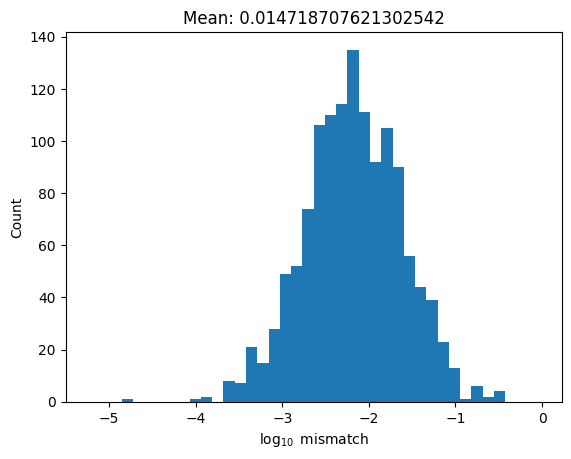

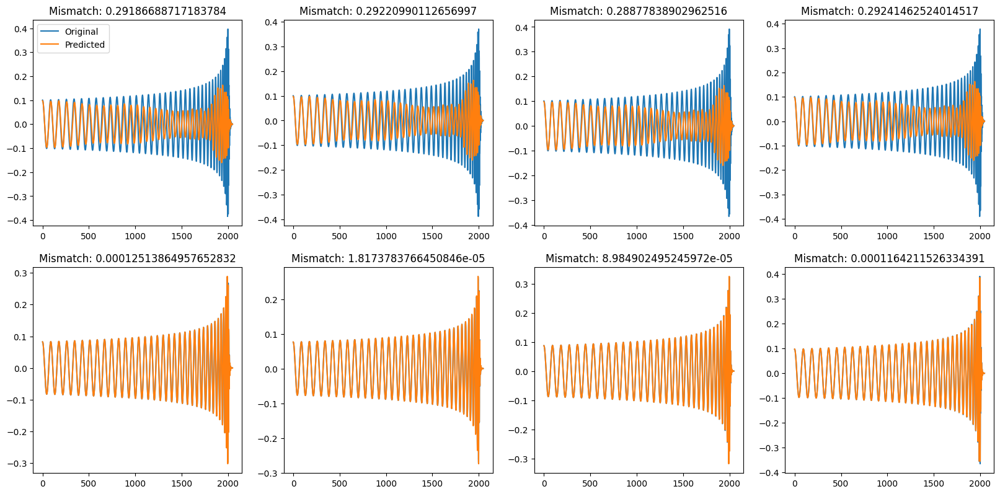

In [ ]:
from h5py import File

f = File("/home/nino/GW/data/sxs_clean.h5")

plot_performance(model.model.predict(f['parameters'][:]), np.real(f['waveforms'][:]), f['waveforms'].attrs['delta_t_seconds'])

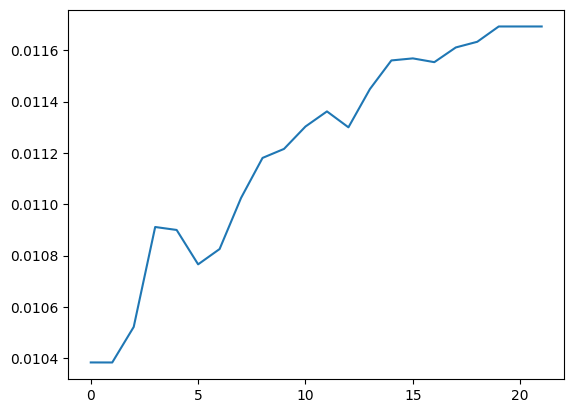

In [ ]:
from utils.utils import load_sxs_data
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt

test_loss = []

for i in range(100, 1200, 50):
    x_train, y_train, x_test, y_test = load_sxs_data(i)
    test_loss.append(mean_absolute_error(np.real(y_train), model.model.predict(x_train, verbose=0, batch_size = 128)))

plt.plot(test_loss)

In [ ]:
from utils.utils import load_sxs_data

x_train, y_train, x_test, y_test = load_sxs_data(700)

y_train, y_test = np.real(y_train), np.real(y_test)

model.model.load_weights("/home/nino/GW/Keras-Project-Template/experiments/sxs_tl_1/best_model.hdf5")

y_pred_tr = model.model.predict(x_train, batch_size = 64)
y_pred_ts = model.model.predict(x_test, batch_size = 64)

10/10 [==============================] - 0s 9ms/step


Calculating mismatches: 100%|██████████| 1264/1264 [00:34<00:00, 36.15it/s]


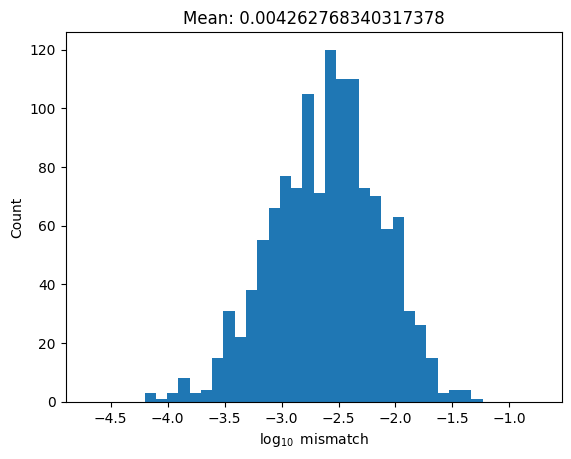

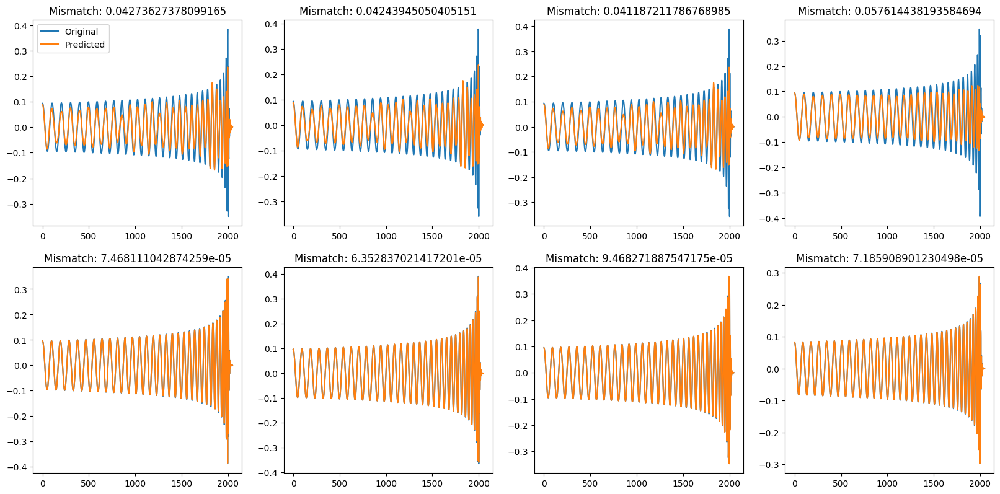

In [ ]:
mm, _, _ = plot_performance(y_pred_tr, y_train, f['waveforms'].attrs['delta_t_seconds'])

Calculating mismatches: 100%|██████████| 619/619 [00:17<00:00, 35.32it/s]


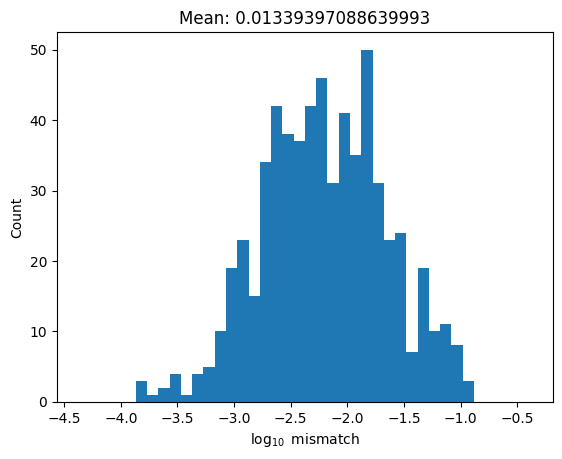

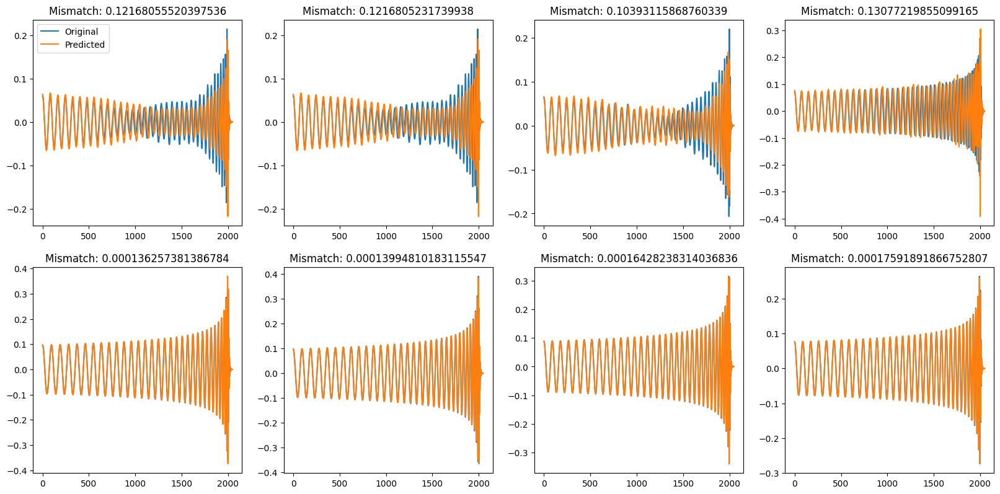

In [ ]:
mm, _, _ = plot_performance(y_pred_ts, y_test, f['waveforms'].attrs['delta_t_seconds'])

In [ ]:
# from sklearn.utils import shuffle

# x_train = f['parameters'][:600]
# y_train = f['waveforms'][:600]
# x_test = f['parameters'][600:]
# y_test = f['waveforms'][600:]

# x_train, y_train = shuffle(x_train, y_train, random_state=37)
# x_test, y_test = shuffle(x_test, y_test, random_state=37)


In [ ]:
# x_tr_df = pd.DataFrame(x_train, columns = names)
# x_ts_df = pd.DataFrame(x_test, columns = names)
# sns.pairplot(x_tr_df, corner=True)

In [ ]:
# sns.pairplot(x_ts_df, corner = True)

# cVAE

In [3]:
from keras.models import load_model
import h5py
import joblib
from utils.utils import load_sxs_data

dec = load_model("/home/nino/GW/Keras-Project-Template/experiments/cvae/decoder_cvae")
enc = load_model("/home/nino/GW/Keras-Project-Template/experiments/cvae/encoder_cvae")
# umap = joblib.load("/home/nino/GW/data/umap_obj.bin")
f_sur = h5py.File("/home/nino/GW/data/bbh_qzp_data.hdf5")
sxs_x_train, sxs_y_train, sxs_x_test, sxs_y_test = load_sxs_data(700)
sxs_y_train = np.real(sxs_y_train)
sxs_y_test = np.real(sxs_y_test)
# sxs_z_umap = umap.transform(sxs_y_train)

sxs_z_mean, sxs_z_logstd, sxs_z_sample = enc.predict([sxs_y_train, sxs_x_train], batch_size = 128)
sxs_z_mean_ts, sxs_z_logstd_ts, sxs_z_sample_ts = enc.predict([sxs_y_test, sxs_x_test], batch_size = 128)


2024-05-04 14:16:48.024694: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-04 14:16:48.935634: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10000 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:3b:00.0, compute capability: 7.5


2024-05-04 14:16:54.700506: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2024-05-04 14:16:55.560775: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


5/5 [==============================] - 0s 68ms/step


10/10 [==============================] - 1s 10ms/step


Calculating mismatches: 100%|██████████| 1264/1264 [00:50<00:00, 25.24it/s]


(array([0.00784128, 0.22638688, 0.00456929, ..., 0.01980113, 0.01400089,
        0.02543939]),
 [1, 17, 38, 107],
 [24, 396, 462, 604])

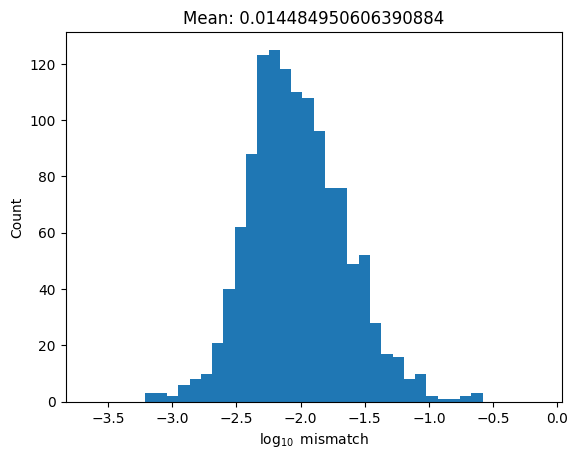

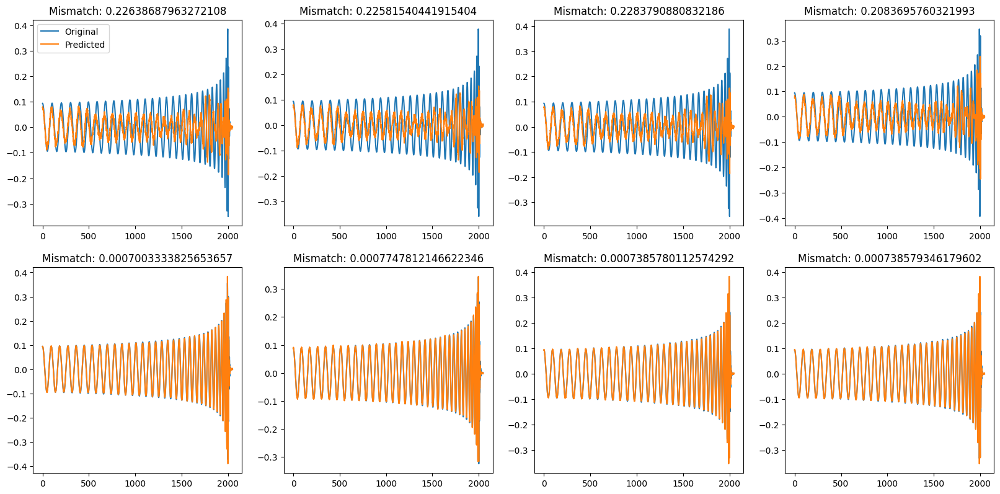

In [4]:
plot_performance(dec.predict([sxs_z_mean, sxs_x_train], batch_size = 128), sxs_y_train, f_sur['waveforms'].attrs['delta_t_seconds'])

5/5 [==============================] - 0s 6ms/step


Calculating mismatches:   0%|          | 0/619 [00:00<?, ?it/s]

Calculating mismatches: 100%|██████████| 619/619 [00:25<00:00, 24.71it/s]


(array([0.00377483, 0.00632157, 0.02287081, 0.00677003, 0.00252177,
        0.00187206, 0.0039299 , 0.00331088, 0.00746155, 0.00240827,
        0.00709478, 0.00109867, 0.00474557, 0.01946041, 0.00950478,
        0.00492391, 0.00731311, 0.00581982, 0.0030737 , 0.00357406,
        0.00128062, 0.00170131, 0.00440471, 0.00449369, 0.00130597,
        0.00170939, 0.00453665, 0.00648252, 0.00454432, 0.00440509,
        0.0080525 , 0.00420998, 0.00535395, 0.00893971, 0.01453189,
        0.03397501, 0.00654875, 0.00401372, 0.01738084, 0.00649164,
        0.00520226, 0.0133688 , 0.01847702, 0.00518712, 0.01891723,
        0.00997296, 0.01664196, 0.01464798, 0.08593777, 0.01602435,
        0.04994243, 0.0242343 , 0.02052328, 0.00619302, 0.00751546,
        0.02235289, 0.01052155, 0.00943906, 0.00826153, 0.01025767,
        0.02495851, 0.00399873, 0.00959425, 0.01178694, 0.09474686,
        0.00806665, 0.03262579, 0.0202587 , 0.00515829, 0.00511939,
        0.01586366, 0.00650273, 0.04510391, 0.01

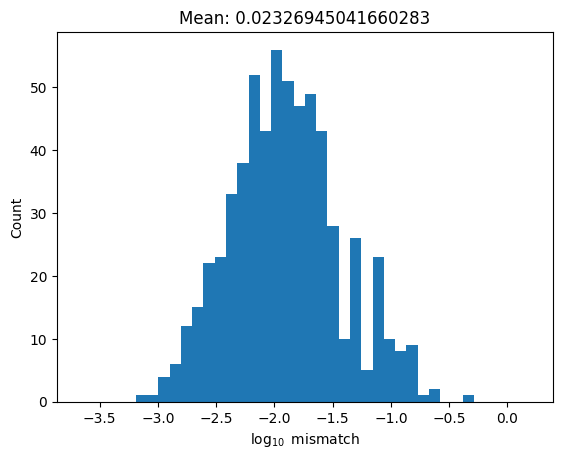

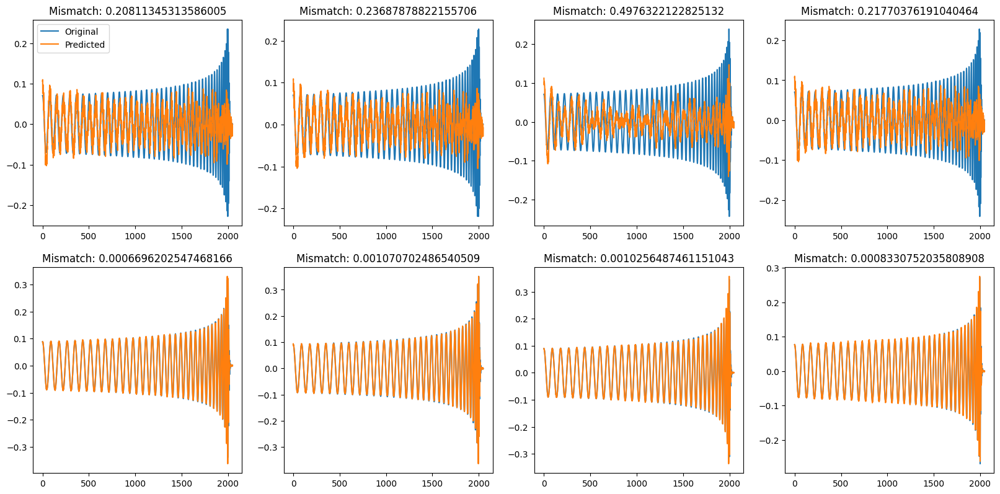

In [6]:
plot_performance(dec.predict([sxs_z_mean_ts, sxs_x_test], batch_size=128), sxs_y_test, f_sur['waveforms'].attrs['delta_t_seconds'])

In [41]:
z_samples = np.random.normal(0, 1, (100, 10))
pars = np.tile(sxs_x_test[0], (100, 1))
y_ground = np.tile(sxs_y_test[0], (100, 1))

In [42]:
pars.shape

(100, 7)

In [15]:
import keras
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = []

callbacks.append(EarlyStopping(monitor = 'val_loss', patience = 50, min_delta = 1e-6))
callbacks.append(ReduceLROnPlateau(monitor = 'loss', factor = 0.1, patience = 15, verbose = 1, min_lr = 1e-7))

In [16]:
# from keras import layers
# import keras.initializers

# model.model.trainable = False

# identity_initializer = keras.initializers.Identity()
# dropout_rate = 0.001

# inp = keras.Input(x_train.shape[1])
# x = model.model(inp)

# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(x)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dropout(dropout_rate, seed = 37)(tl)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dropout(dropout_rate, seed = 37)(tl)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dropout(dropout_rate, seed = 37)(tl)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dense(512, activation='leaky_relu', kernel_initializer=identity_initializer)(tl)
# tl = layers.Dense(y_train.shape[1], kernel_initializer=identity_initializer)(tl)
# opt = layers.Add()([tl, x])

# tl_model = keras.models.Model(inp, opt)

In [22]:
tf.keras.backend.set_value(model.model.optimizer.learning_rate, 0.0001/2)

In [26]:
model.model.optimizer.learning_rate.numpy()

5e-05

In [23]:
# model.model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.0001), loss = 'mae')
model.model.fit(x = x_train, y = y_train, validation_data=(x_test, y_test), epochs = 70, callbacks = callbacks, batch_size = 32)


# tl_model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.0001), loss = 'mae')
# tl_model.fit(x = x_train, y = y_train, validation_data=(x_test, y_test), epochs = 70, callbacks = callbacks, batch_size = 32)

Epoch 1/70
 1/40 [..............................] - ETA: 11s - loss: 0.0064

40/40 [==============================] - 13s 327ms/step - loss: 0.0060 - val_loss: 0.0097 - lr: 5.0000e-05
Epoch 2/70
12/40 [========>.....................] - ETA: 7s - loss: 0.0050

KeyboardInterrupt: 

 2/28 [=>............................] - ETA: 3s 

28/28 [==============================] - 4s 126ms/step


Calculating mismatches: 100%|██████████| 881/881 [00:12<00:00, 68.60it/s]
/home/nino/miniconda3/envs/Tensorflow/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


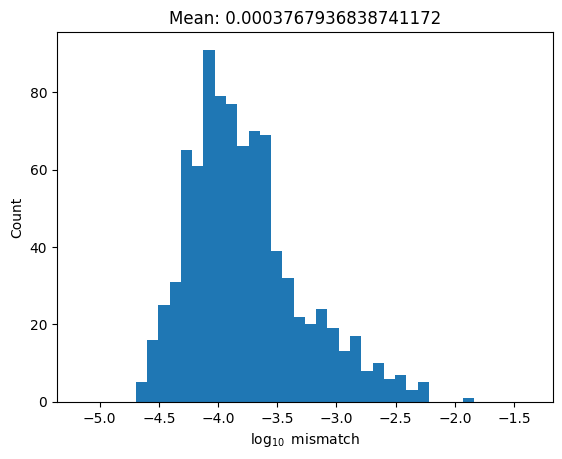

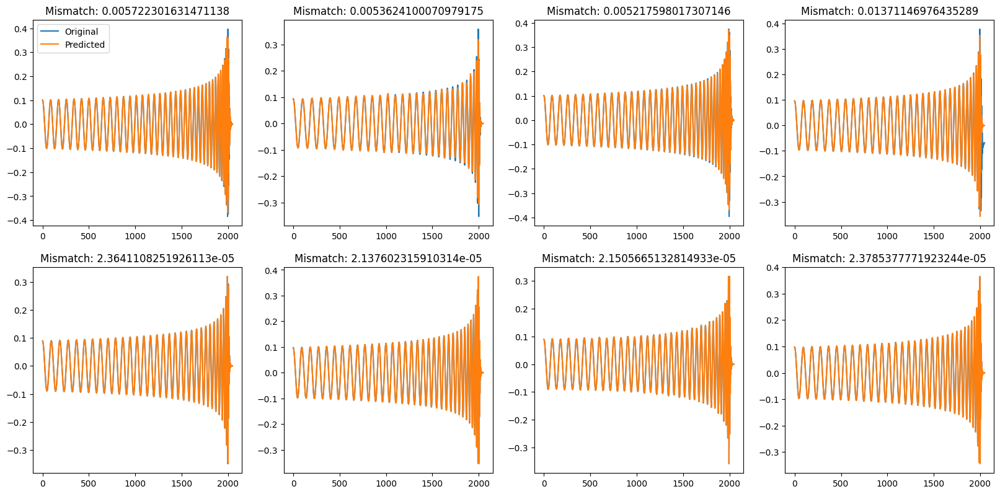

In [ ]:
_=plot_performance(model.model.predict(x_train), y_train, f['waveforms'].attrs['delta_t_seconds'])

 1/14 [=>............................] - ETA: 2s

14/14 [==============================] - 2s 119ms/step


Calculating mismatches: 100%|██████████| 428/428 [00:06<00:00, 67.10it/s]


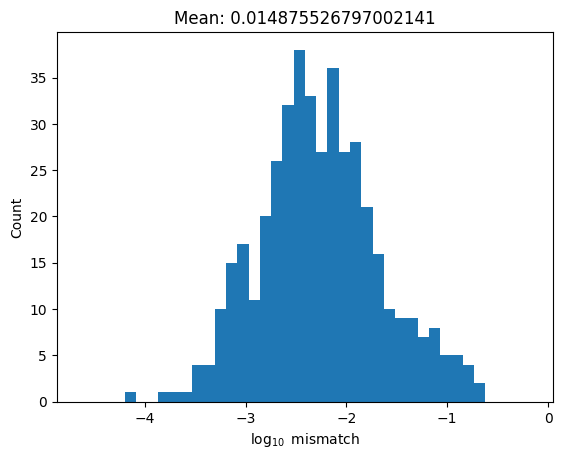

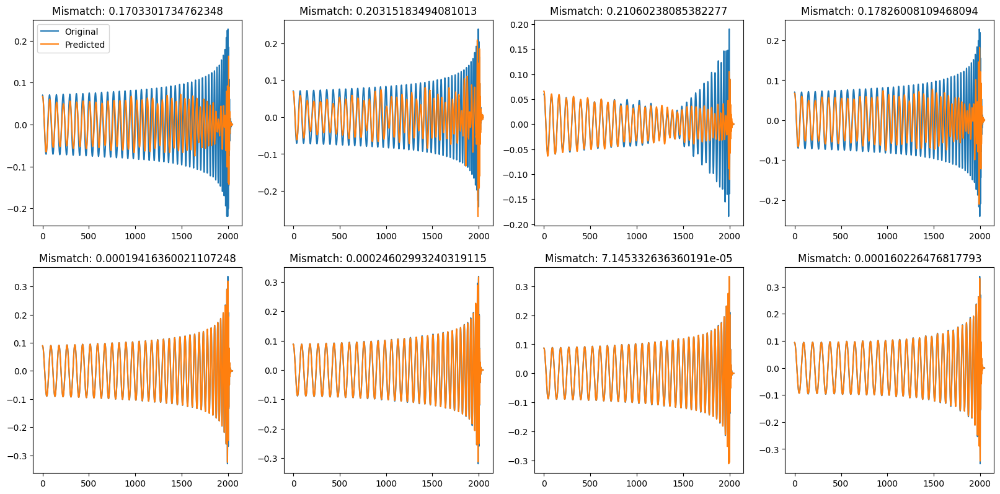

In [ ]:
_=plot_performance(model.model.predict(x_test), y_test, f['waveforms'].attrs['delta_t_seconds'])

In [ ]:
model.model.summary()

Model: "model_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(None, 2)]               0         
                                                                 
 model_26 (Functional)       (None, 10)                1319946   
                                                                 
 model_25 (Functional)       (None, 10)                7399434   
                                                                 
 model_29 (Functional)       (None, 2048)              5722370   
                                                                 
Total params: 14,441,750
Trainable params: 14,441,750
Non-trainable params: 0
_________________________________________________________________


In [ ]:
y_pred = model.model.predict(data_loader.X_train, batch_size = 1024)

79/79 [==============================] - 269s 3s/step


In [ ]:
from sklearn.metrics import mean_absolute_error

mean_absolute_error(y_pred, data_loader.y_train)

0.0028867391011154512

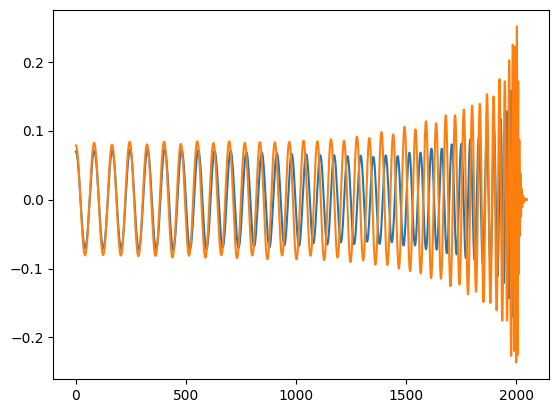

In [ ]:
plt.plot(y_pred[1])
plt.plot(data_loader.y_train[1])

In [ ]:
plot_performance(model.model.predict(data_loader.X_train, batch_size = 1024), data_loader.y_train, data_loader.delta_t)

 2/79 [..............................] - ETA: 16s

63/79 [======================>.......] - ETA: 3s

KeyboardInterrupt: 

20/20 [==============================] - 6s 231ms/step


Calculating mismatches: 100%|██████████| 20000/20000 [08:20<00:00, 39.94it/s]


(array([0.58128536, 0.65026211, 0.56689055, ..., 0.58142057, 0.50053968,
        0.27879486]),
 [2215, 8836, 15109, 17987],
 [1480, 4258, 11828, 12688])

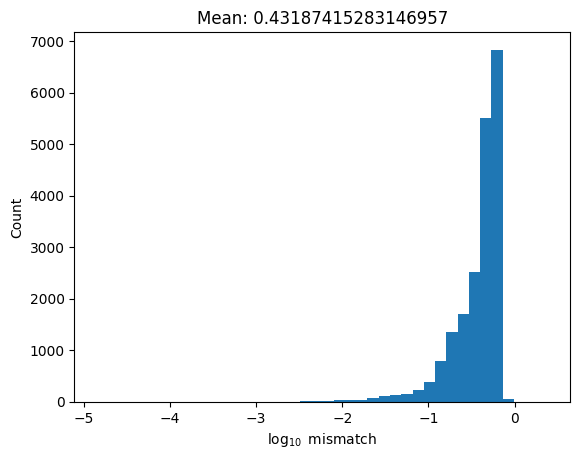

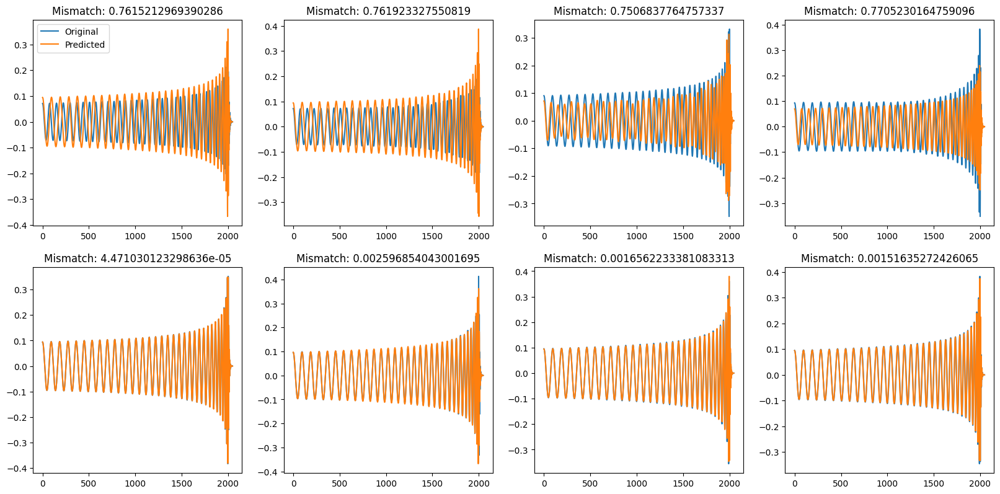

In [ ]:
plot_performance(model.model.predict(data_loader.X_test, batch_size = 1024), data_loader.y_test, data_loader.delta_t)

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
import keras

callbacks = []
callbacks.append(EarlyStopping(monitor = 'val_loss', patience = 50))
callbacks.append(ReduceLROnPlateau(monitor = 'loss', factor = 0.5, patience = 15))

optimizer = keras.optimizers.Adam(learning_rate = 0.0001)

In [ ]:
model.model.compile(loss='mae', optimizer=optimizer)

history = model.model.fit(
    x = data_loader.X_train,
    y = data_loader.y_train,
    validation_data = (data_loader.X_test, data_loader.y_test),
    epochs=100,
    verbose=1,
    batch_size=256,
    callbacks=callbacks
)   

Epoch 1/100


2024-04-25 19:05:08.692628: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2024-04-25 19:05:09.620295: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


313/313 [==============================] - 138s 396ms/step - loss: 0.0280 - val_loss: 0.0140 - lr: 1.0000e-04
Epoch 2/100
313/313 [==============================] - 121s 386ms/step - loss: 0.0135 - val_loss: 0.0117 - lr: 1.0000e-04
Epoch 3/100
313/313 [==============================] - 121s 387ms/step - loss: 0.0108 - val_loss: 0.0118 - lr: 1.0000e-04
Epoch 4/100
313/313 [==============================] - 121s 387ms/step - loss: 0.0094 - val_loss: 0.0102 - lr: 1.0000e-04
Epoch 5/100
313/313 [==============================] - 121s 387ms/step - loss: 0.0088 - val_loss: 0.0079 - lr: 1.0000e-04
Epoch 6/100
313/313 [==============================] - 121s 387ms/step - loss: 0.0078 - val_loss: 0.0081 - lr: 1.0000e-04
Epoch 7/100
313/313 [==============================] - 121s 386ms/step - loss: 0.0073 - val_loss: 0.0080 - lr: 1.0000e-04
Epoch 8/100
313/313 [==============================] - 122s 389ms/step - loss: 0.0071 - val_loss: 0.0085 - lr: 1.0000e-04
Epoch 9/100
313/313 [===============

2500/2500 [==============================] - 152s 60ms/step


Calculating mismatches: 100%|██████████| 80000/80000 [29:37<00:00, 45.02it/s]  


(array([0.000916  , 0.0061761 , 0.00060916, ..., 0.00964957, 0.00026705,
        0.00474478]),
 [719, 39149, 55041, 75738],
 [6523, 11472, 17623, 64244])

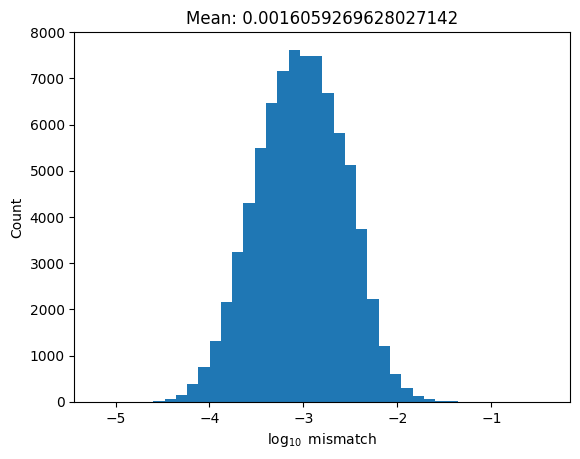

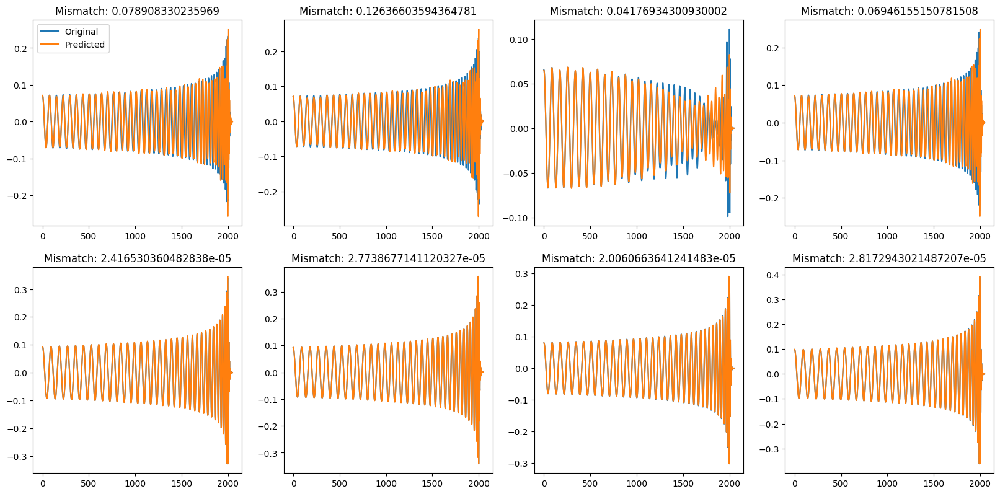

In [ ]:
plot_performance(model.model.predict(data_loader.X_train), data_loader.y_train, data_loader.delta_t)

In [ ]:
model.model.save("/home/nino/GW/Keras-Project-Template/best_qzp.hdf5")

In [ ]:
from utils.plot_utils import make_plots

make_plots(model.model.predict(data_loader.X_train, batch_size=1024), data_loader.y_train, "/home/nino/GW/Keras-Project-Template/figures/post_trained_reg_ae_qzp_bbh/train", data_loader.delta_t)

79/79 [==============================] - 37s 434ms/step


Calculating mismatches:   1%|          | 532/80000 [00:12<31:25, 42.14it/s]


KeyboardInterrupt: 

In [ ]:
make_plots(model.model.predict(data_loader.X_test, batch_size=1024), data_loader.y_test, "/home/nino/GW/Keras-Project-Template/figures/post_trained_reg_ae_qzp_bbh/test", data_loader.delta_t)

In [ ]:
from sklearn.metrics import mean_absolute_error
model.autoencoder.autoencoder.load_weights("/home/nino/GW/Keras-Project-Template/experiments/reg_ae_qzp_bbh1/reg_ae_qzp_bbh/checkpoints/best_autoencoder.hdf5")
mean_absolute_error(model.autoencoder.autoencoder.predict(data_loader.y_test, batch_size = 512)[1], data_loader.y_test)

 1/40 [..............................] - ETA: 1s

40/40 [==============================] - 3s 70ms/step


0.0005734912870505184

In [ ]:
train_ae_gen = data_loader.get_autoencoder_train_data()
train_ae_gen[0]

(array([[ 7.24490785e-02,  7.22558716e-02,  7.16705565e-02, ...,
          2.81994285e-05,  1.72553460e-04,  1.09876372e-04],
        [ 6.81917693e-02,  6.80250102e-02,  6.74790692e-02, ...,
         -1.57701822e-04, -5.31682303e-05,  7.15534276e-05],
        [ 7.87354588e-02,  7.85185170e-02,  7.78725221e-02, ...,
         -2.52046614e-04, -3.83629961e-05,  1.08309406e-04],
        ...,
        [ 6.90118278e-02,  6.88059499e-02,  6.81938610e-02, ...,
          1.45202207e-04,  1.75512605e-04,  3.74511667e-05],
        [ 8.59248272e-02,  8.57434196e-02,  8.51544981e-02, ...,
          2.03915455e-04,  5.90405219e-05, -9.01401096e-05],
        [ 8.41426941e-02,  8.39248927e-02,  8.32729074e-02, ...,
          3.26068163e-04,  1.00279888e-04, -1.17545759e-04]]),
 [array([[-1.24745429e+00, -1.76717687e+00,  8.83192793e-02,
           1.42478466e-01,  1.88636675e-01, -4.11393285e-01,
           1.20356791e-01,  5.35634375e+00,  3.24645221e-01,
           1.09523201e+00,  6.16386645e-02,  6

1/1 [==============================] - 0s 26ms/step


Calculating mismatches: 100%|██████████| 50/50 [00:00<00:00, 75.18it/s]


(array([1.60091600e-06, 3.11433573e-05, 9.12526379e-05, 4.14985125e-05,
        7.75481996e-06, 9.29947011e-07, 2.46321966e-05, 3.64021511e-05,
        5.92042029e-05, 2.09141657e-04, 5.67269690e-05, 3.86933539e-05,
        1.01030733e-04, 3.15707466e-06, 2.18257481e-04, 8.93930868e-05,
        2.45968445e-06, 4.03642342e-06, 2.31275910e-05, 9.33032498e-05,
        6.95180693e-05, 3.20284258e-04, 2.83906412e-05, 2.44128037e-05,
        2.36797195e-05, 1.46086698e-05, 3.28877772e-05, 3.75218100e-06,
        5.66624104e-05, 7.70129220e-05, 2.28149694e-05, 4.77278687e-05,
        1.21814786e-04, 1.92295739e-05, 4.48019657e-05, 2.03363152e-04,
        2.81372092e-05, 8.31567563e-06, 3.93761078e-05, 2.42611092e-05,
        1.75731408e-04, 5.81050315e-05, 8.89293325e-05, 1.41743805e-05,
        5.40753555e-05, 2.48614235e-05, 5.20021677e-06, 2.64713056e-05,
        4.73911168e-05, 1.29501562e-05]),
 [9, 14, 21, 35],
 [0, 5, 13, 16])

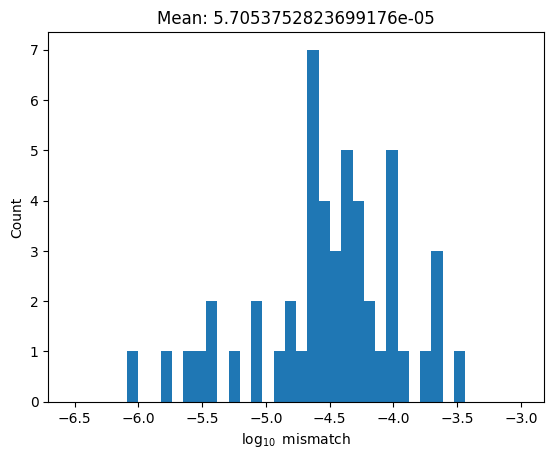

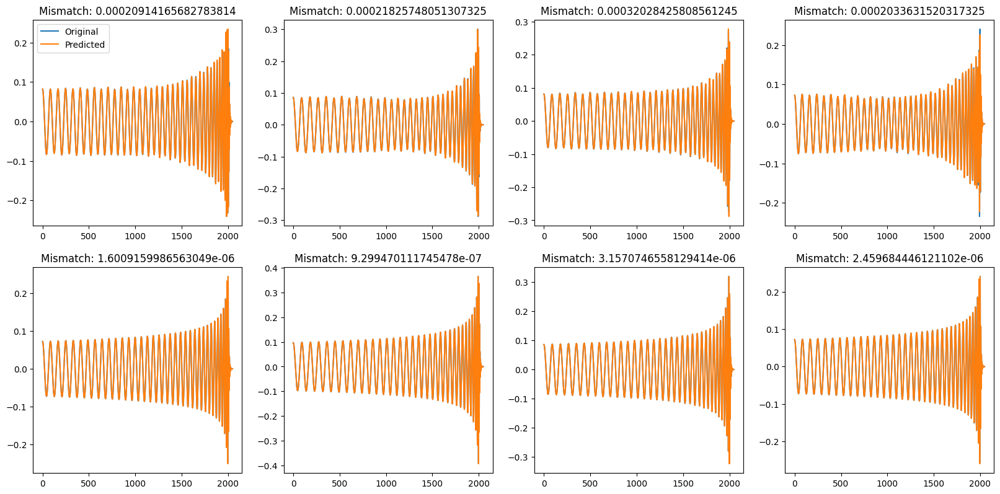

In [ ]:
# plt.plot(train_ae_gen[0][0][40])
plot_performance(model.autoencoder.autoencoder.predict(train_ae_gen[0][0], batch_size=50)[1], train_ae_gen[0][0], data_loader.delta_t)

# Mapper exploration

In [ ]:
from sklearn.metrics import mean_absolute_error
from models.parametric_umap import ParametricUMAP

emb_load = model.embedder.embedder.predict(data_loader.X_train, batch_size = 1024)

new_embedder = ParametricUMAP(config, data_loader)
new_embedder.parametric_model.load_weights("/home/nino/GW/Keras-Project-Template/experiments/reg_ae_qzp_bbh1/reg_ae_qzp_bbh/checkpoints/best_embedder.hdf5")

emb_reloaded = new_embedder.embedder.predict(data_loader.X_train, batch_size = 1024)

mean_absolute_error(emb_load, emb_reloaded)


79/79 [==============================] - 0s 1ms/step


Computing nearest neighbors for parametric UMAP


Thu Apr 25 16:39:20 2024 Building RP forest with 19 trees


Thu Apr 25 16:39:26 2024 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations
79/79 [==============================] - 0s 1ms/step


0.0

In [ ]:
data_loader.add_umap_data(model.embedder.embedder.predict(data_loader.X_train, batch_size = 1024, verbose = 0), model.embedder.embedder.predict(data_loader.X_test, batch_size = 1024, verbose = 0))
data_loader.add_latent_data(model.autoencoder.encoder.predict(data_loader.y_train, batch_size = 1024, verbose = 0), model.autoencoder.encoder.predict(data_loader.y_test, batch_size = 1024, verbose = 0))

In [ ]:
import keras
from keras import layers
from models.gw_latent_mappers import ConvBlock1D

input_output_shape = config.model.latent_dim

inp = keras.Input(input_output_shape)

# x = ConvBlock1D(config, input_output_shape).conv_block(inp)
# y = layers.Add()([inp, x])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# y = layers.Add()([x, y])

# x = ConvBlock1D(config, input_output_shape).conv_block(y)
# opt = layers.Add()([x, y])

x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(inp)
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)
x = layers.Concatenate()([inp, x])
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)
x = layers.Concatenate()([inp, x])
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)
x = layers.Concatenate()([inp, x])
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)
x = layers.Dense(1024, activation='leaky_relu', kernel_initializer='he_uniform')(x)

opt = layers.Dense(input_output_shape)(x)

new_mapper = keras.Model(inp, opt)

from keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = []
callbacks.append(EarlyStopping(monitor = 'val_loss', patience = 50))
callbacks.append(ReduceLROnPlateau(monitor = 'loss', factor = 0.5, patience = 15))

optimizer = keras.optimizers.Adam(learning_rate = 0.0001)

In [ ]:
new_mapper.compile(loss='mae', optimizer=optimizer)

history_mapper = new_mapper.fit(
    data_loader.get_mapper_train_data(),
    validation_data = data_loader.get_mapper_test_data(),
    epochs=15,
    verbose=1,
    batch_size=256,
    callbacks=callbacks
)   

Epoch 1/15
1600/1600 [==============================] - 100s 56ms/step - loss: 0.0465 - val_loss: 0.0420 - lr: 1.0000e-04
Epoch 2/15
1600/1600 [==============================] - 90s 57ms/step - loss: 0.0420 - val_loss: 0.0421 - lr: 1.0000e-04
Epoch 3/15
1600/1600 [==============================] - 90s 56ms/step - loss: 0.0419 - val_loss: 0.0417 - lr: 1.0000e-04
Epoch 4/15
1005/1600 [=================>............] - ETA: 31s - loss: 0.0419

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import mean_absolute_error

mean_absolute_error(scaler_encoding.inverse_transform(new_mapper.predict(emb_scaled_train)), data_loader.latent_train)

   1/2500 [..............................] - ETA: 4:30

2500/2500 [==============================] - 4s 1ms/step


0.041333098

In [ ]:
from sklearn.metrics import mean_absolute_error

emb = model.embedder.embedder.predict(data_loader.X_test, batch_size = 512)
map = new_mapper.predict(emb, batch_size = 512)

print(mean_absolute_error(map, model.autoencoder.encoder.predict(data_loader.y_test, batch_size = 512)))

y_pred = model.autoencoder.decoder.predict(map, batch_size = 512)

40/40 [==============================] - 0s 1ms/step


40/40 [==============================] - 1s 23ms/step
0.04161087
40/40 [==============================] - 2s 53ms/step


In [ ]:
import pandas as pd

pd.DataFrame(data_loader.latent_train).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000
mean,-0.178742,-0.296766,0.067965,0.084873,-0.419296,-0.052326,0.101347,1.389318,-0.227406,0.043134,0.036721,0.049796,-0.102416,0.006181,-0.058427
std,0.048224,0.091772,0.001403,0.011288,0.082471,0.080295,0.003558,0.239550,0.079758,0.038094,0.002221,0.001530,0.006371,0.003569,0.075977
min,-0.405558,-0.624261,0.058514,0.008939,-0.752970,-0.373850,0.066750,0.312502,-0.547083,-0.098270,0.022343,0.037038,-0.157089,-0.051464,-0.376322
25%,-0.214838,-0.358637,0.067125,0.078349,-0.483763,-0.111756,0.099391,1.230566,-0.289713,0.017602,0.035376,0.048873,-0.105697,0.004665,-0.108729
50%,-0.180360,-0.294345,0.067998,0.084867,-0.415783,-0.055662,0.101422,1.385884,-0.222343,0.039548,0.036708,0.049808,-0.102422,0.006136,-0.057638
75%,-0.140965,-0.235419,0.068807,0.091253,-0.358441,0.003278,0.103419,1.550538,-0.164764,0.060939,0.037914,0.050754,-0.098910,0.007751,-0.004163
max,-0.000537,0.018811,0.093335,0.192643,-0.129117,0.201354,0.133999,2.105797,0.081173,0.277557,0.060910,0.061530,-0.049427,0.039830,0.183713


Calculating mismatches: 100%|██████████| 20000/20000 [04:44<00:00, 70.38it/s]


(array([0.35326382, 0.64509139, 0.55018271, ..., 0.31961928, 0.34326136,
        0.4159992 ]),
 [7795, 7874, 13333, 18842],
 [2719, 2739, 17484, 19523])

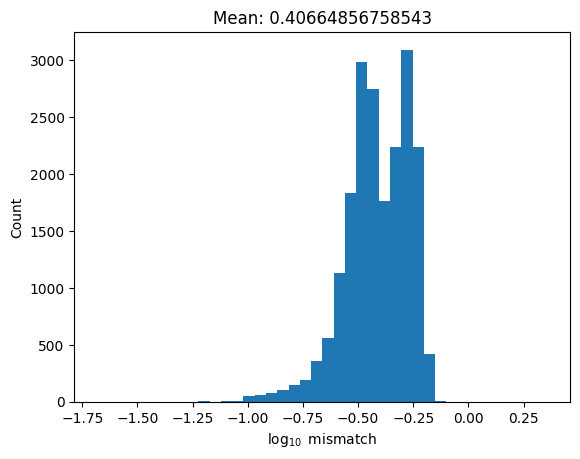

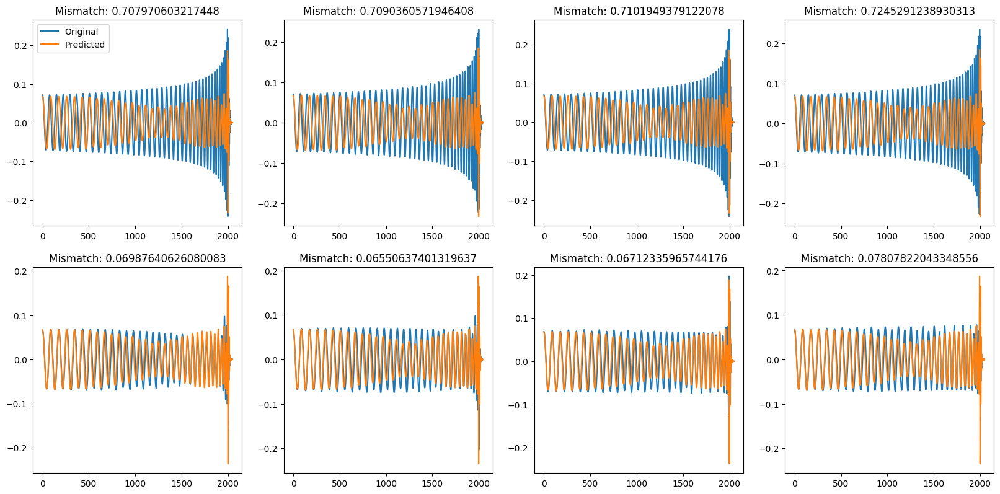

In [ ]:
plot_performance(y_pred, data_loader.y_test, data_loader.delta_t)

In [ ]:
rec_test = model.autoencoder.autoencoder.predict(data_loader.y_test, batch_size=512)

Calculating mismatches: 100%|██████████| 20000/20000 [04:54<00:00, 67.86it/s]


(array([0.60712904, 0.51366142, 0.39921241, ..., 0.54060826, 0.60041958,
        0.47029053]),
 [936, 14396, 17263, 19493],
 [1577, 11077, 13438, 16524])

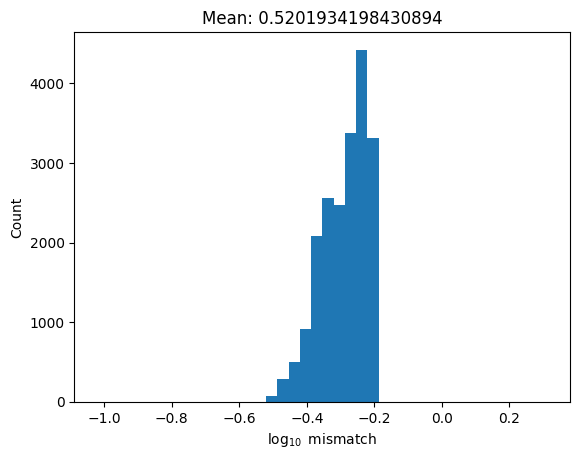

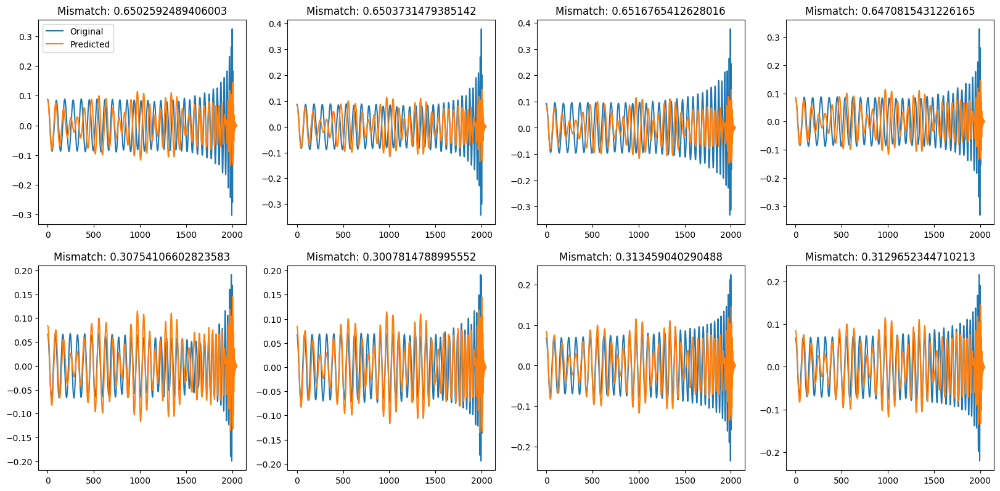

In [ ]:
plot_performance(rec_test[1], data_loader.y_test, data_loader.delta_t)

In [ ]:
plot_performance(model.model.predict(data_loader.X_test, batch_size = 512), data_loader.y_test, data_loader.delta_t)

40/40 [==============================] - 5s 103ms/step


Calculating mismatches:  50%|█████     | 10053/20000 [02:20<02:11, 75.83it/s]

Calculating mismatches: 100%|██████████| 80000/80000 [18:47<00:00, 70.95it/s]


(array([0.56899847, 0.4092991 , 0.62314165, ..., 0.46213427, 0.62586734,
        0.56284696]),
 [10148, 14834, 20663, 47716],
 [14415, 23484, 31064, 49337])

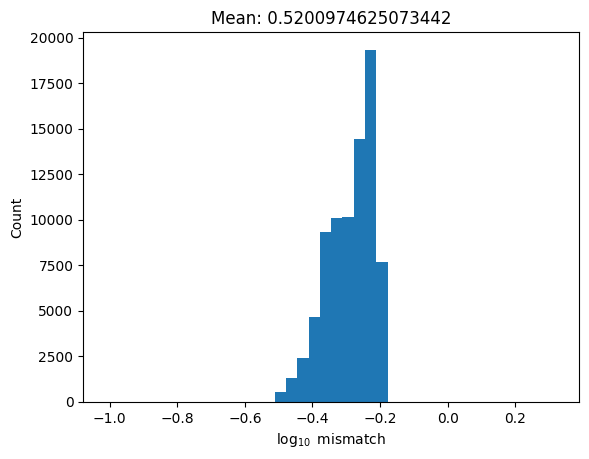

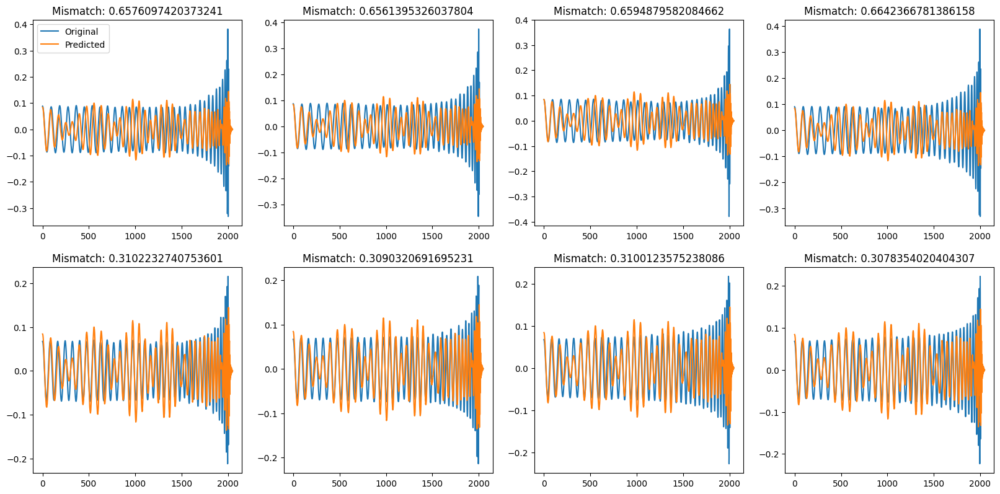

In [ ]:
plot_performance(y_pred, data_loader.y_train, data_loader.delta_t)

157/157 [==============================] - 9s 49ms/step


Calculating mismatches: 100%|██████████| 80000/80000 [18:32<00:00, 71.94it/s] 


(array([0.56953054, 0.4091459 , 0.62300747, ..., 0.46201407, 0.62571972,
        0.56269558]),
 [10148, 14834, 20663, 47716],
 [14415, 23484, 31064, 49337])

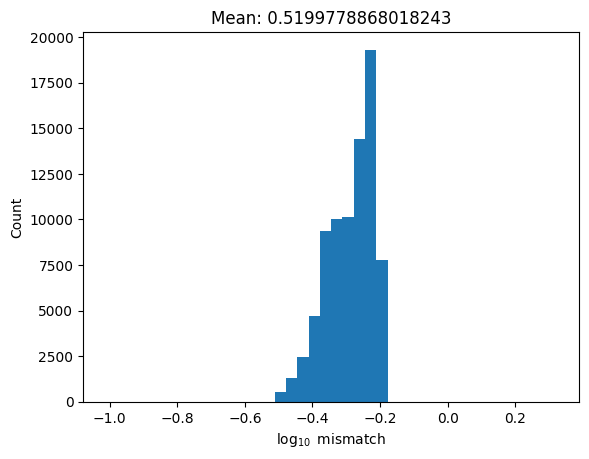

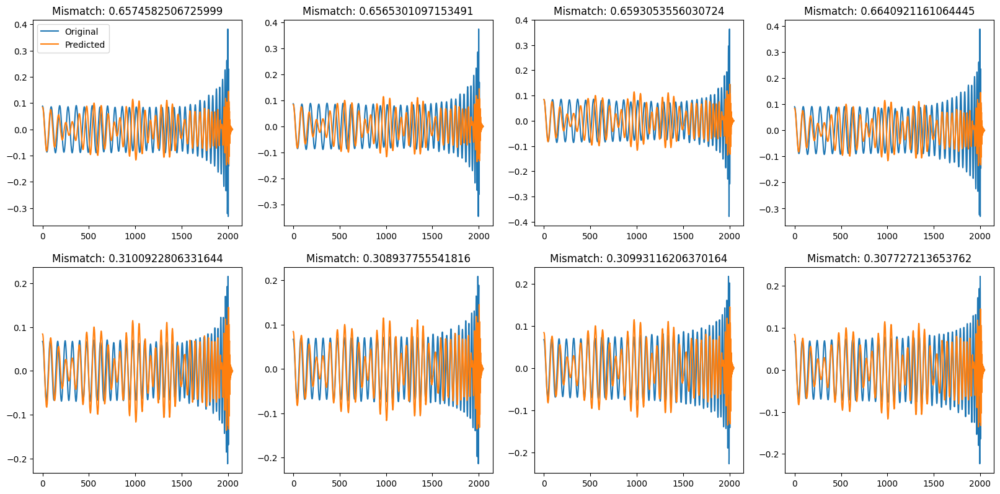

In [ ]:
inp = keras.Input(data_loader.in_out_shapes['input_shape'])

x = model.embedder.embedder(inp)
x = new_mapper(x)
opt = model.autoencoder.decoder(x)

model2 = keras.Model(inp, opt)

plot_performance(model2.predict(data_loader.X_train, batch_size = 512), data_loader.y_train, data_loader.delta_t)

# Transfer learning

In [ ]:
config, _ = process_config(os.path.join(model_dir, "config.json"))
data_loader = init_obj(config, "data_loader", data_loader_module)


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

data_loader.X_train = scaler.fit_transform(data_loader.X_train[:, [0, 2, 3]])
data_loader.X_test = scaler.transform(data_loader.X_test[:, [0, 2, 3]])

data_loader.in_out_shapes['input_shape'] = 3

In [ ]:
model = init_obj(config, "model", models_module, data_loader = data_loader, inference = True)

model.load(os.path.join(model_dir, "best_model.hdf5"))

Loading model checkpoint /home/nino/GW/Keras-Project-Template/experiments/2024-04-19_09-41-22/reg_ae_osv_bbh/checkpoints/best_model.hdf5 ...

Model loaded


In [ ]:
import h5py

f_sxs = h5py.File("/home/nino/GW/data/sxs_augmented.h5")

In [ ]:
f_sxs['sxs']['parameters'].attrs['names']

'mass_ratio, spin1 (x, y, z), spin2 (x, y, z)'

In [ ]:
sxs_pars = []
sxs_waves = []
ct = 0

print(len(f_sxs['sxs']['waveforms'][:]))

for pars, waves in zip(f_sxs['sxs']['parameters'][:], f_sxs['sxs']['waveforms']):
    if pars[0] < 8 and pars[1] < 0.1 and pars[2] < 0.1 and pars[3] < 0.8 and pars[4] < 0.1 and pars[5] < 0.1 and pars[6] < 0.8:
        sxs_pars.append(pars)
        sxs_waves.append(waves)
        ct +=1

print(ct)

1314
496


In [ ]:
sxs_pars = scaler.transform(np.array(sxs_pars)[:, [0, 3, 6]])
sxs_waves = np.real(np.array(sxs_waves))

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd

pars_train_ft, pars_test_ft, wv_train_ft, wv_test_ft = train_test_split(sxs_pars, sxs_waves, test_size = 0.2, random_state=42)
pd.to_pickle([pars_train_ft, pars_test_ft, wv_train_ft, wv_test_ft], '/home/nino/GW/data/ft_data_22_04.pkl')

In [ ]:
import keras
opt = keras.optimizers.Adam(learning_rate=1e-6)
model.model.compile(loss= 'mae', optimizer=opt)

In [ ]:
from copy import deepcopy
model_copy = deepcopy(model.model)

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......functional
.........layers
............dense
...............vars
..................0
..................1
............dense_1
...............vars
..................0
..................1
............dense_2
...............vars
..................0
..................1
............dense_3
...............vars
..................0
..................1
............dense_4
...............vars
..................0
..................1
............dense_5
...............vars
..................0
..................1
............dense_6
...............vars
..................0
..................1
............input_layer
...............vars
.........vars
......functional_1
.........layers
............add
...............vars
............add_1
...............vars
............add_2
...............vars
............add_3
...............vars
............add_4
...............vars
............add_5
...............vars
............fu

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = []
callbacks.append(EarlyStopping(monitor = 'val_loss', patience = 50))
callbacks.append(ReduceLROnPlateau(monitor = 'loss', factor = 0.5, patience = 15))

model.model.fit(x = pars_train_ft, y = wv_train_ft, validation_data=(pars_test_ft, wv_test_ft), epochs = 1000, callbacks = callbacks)

Epoch 1/1000


2024-04-22 14:37:05.146286: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2024-04-22 14:37:05.823430: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


13/13 [==============================] - 12s 145ms/step - loss: 0.1702 - val_loss: 0.1862 - lr: 1.0000e-06
Epoch 2/1000
13/13 [==============================] - 1s 40ms/step - loss: 0.1476 - val_loss: 0.1653 - lr: 1.0000e-06
Epoch 3/1000
13/13 [==============================] - 1s 41ms/step - loss: 0.1299 - val_loss: 0.1470 - lr: 1.0000e-06
Epoch 4/1000
13/13 [==============================] - 1s 40ms/step - loss: 0.1153 - val_loss: 0.1341 - lr: 1.0000e-06
Epoch 5/1000
13/13 [==============================] - 1s 40ms/step - loss: 0.1060 - val_loss: 0.1265 - lr: 1.0000e-06
Epoch 6/1000
13/13 [==============================] - 1s 40ms/step - loss: 0.0991 - val_loss: 0.1193 - lr: 1.0000e-06
Epoch 7/1000
13/13 [==============================] - 1s 40ms/step - loss: 0.0933 - val_loss: 0.1127 - lr: 1.0000e-06
Epoch 8/1000
13/13 [==============================] - 1s 40ms/step - loss: 0.0874 - val_loss: 0.1072 - lr: 1.0000e-06
Epoch 9/1000
13/13 [==============================] - 1s 40ms/step 

In [ ]:
M_sun = 1.9885e30
c = 299792458
G = 6.67430e-11

# In order to get the same sampling rate as the BBH datasets:

delta_t_seconds = 2*G*M_sun/(c**3)

# plot_performance(model.model.predict(pars_test_ft, batch_size=100), wv_test_ft, delta_t_seconds)

In [ ]:
print(f"{1/delta_t_seconds:.4e}")

1.0151e+05


In [ ]:
from joblib import load

mm = load('/home/nino/GW/Keras-Project-Template/figures/reg_osv/test/mismatches.bin')

np.argmin(mm)

10247

In [ ]:
pred_tr = model.predict(data_loader.X_train_scaled, batch_size = 512)
pred_ts = model.predict(data_loader.X_test, batch_size = 512)

40/40 [==============================] - 7s 186ms/step


In [ ]:
plot_performance(pred_tr, data_loader.y_train, data_loader.delta_t)

Calculating mismatches:   2%|▏         | 825/40000 [00:17<14:13, 45.91it/s]


KeyboardInterrupt: 

Calculating mismatches: 100%|██████████| 20480/20480 [09:29<00:00, 35.96it/s]


(array([0.39070438, 0.31204683, 0.47893798, ..., 0.09426934, 0.02533924,
        0.67750077]),
 [7519, 11773, 13561, 14173],
 [123, 3077, 3483, 11910])

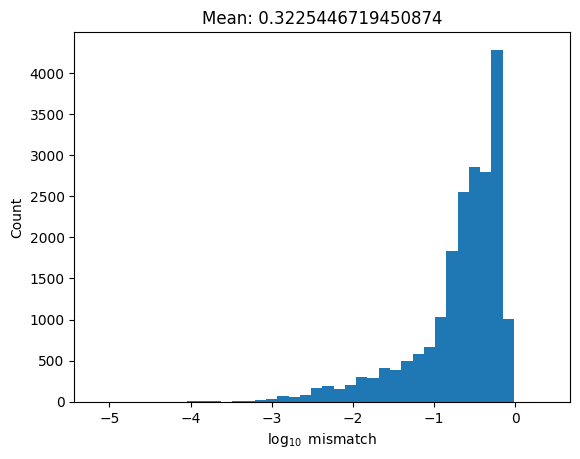

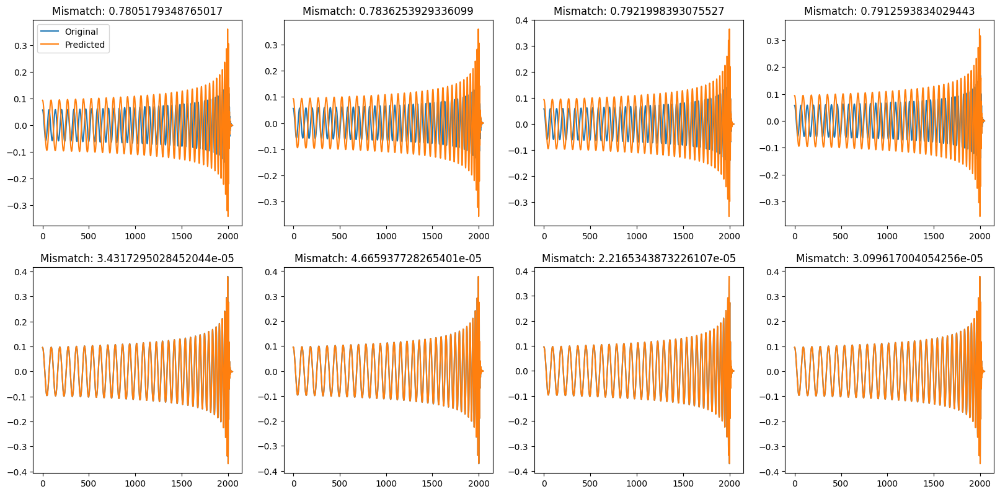

In [ ]:
plot_performance(pred_ts, data_loader.y_test, data_loader.delta_t)

In [18]:
def unwrap_phase(complex_array):
    phase = np.angle(complex_array)
    unwrapped_phase = np.unwrap(phase)
    return unwrapped_phase

def get_phases(array):
    out = unwrap_phase(array)
    out = out-out[..., np.newaxis,0]
    return -out.astype(float)

def set_waveform(wv):
    amp = np.abs(wv)
    phs = get_phases(wv)
    return amp*np.cos(phs)

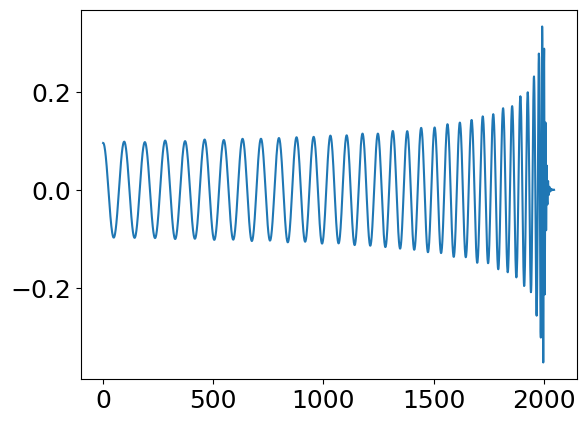

In [ ]:
plt.plot(f['waveforms'][similar_q_idx][40])

In [ ]:
f['parameters'][similar_q_idx][10:20, 1:]

array([[ 0.05417736, -0.01854321, -0.11302058, -0.01776079, -0.01429464,
        -0.04809917],
       [ 0.05921435, -0.03079263,  0.24087214,  0.31170857,  0.23671073,
        -0.20984122],
       [ 0.00886331, -0.13273902,  0.69052213,  0.03746376,  0.07946496,
        -0.09666469],
       [ 0.35844344,  0.04265768, -0.02788368, -0.0419171 ,  0.01455312,
        -0.01278176],
       [-0.04695807,  0.12981326, -0.27658977,  0.13676589,  0.07697688,
         0.77588907],
       [-0.72597391,  0.17660261,  0.08852228, -0.16142527,  0.36252073,
        -0.08012794],
       [-0.07960288, -0.03903661,  0.07314566,  0.13992866, -0.56278206,
        -0.19628579],
       [-0.04473732,  0.53591862, -0.54399061,  0.05410628,  0.0416474 ,
        -0.10609371],
       [ 0.08059065, -0.02003517,  0.48405005, -0.08374696,  0.0626228 ,
        -0.53519166],
       [ 0.07576846, -0.03105825,  0.11747636,  0.00607051,  0.0116789 ,
        -0.79853927]])

qz dataset similar_q_idx, idx 16 -> Big anti-aligned case, idx 28 -> big aligned case, 1 both negative


Text(0.5, 0, 'Time ($M_\\odot$)')

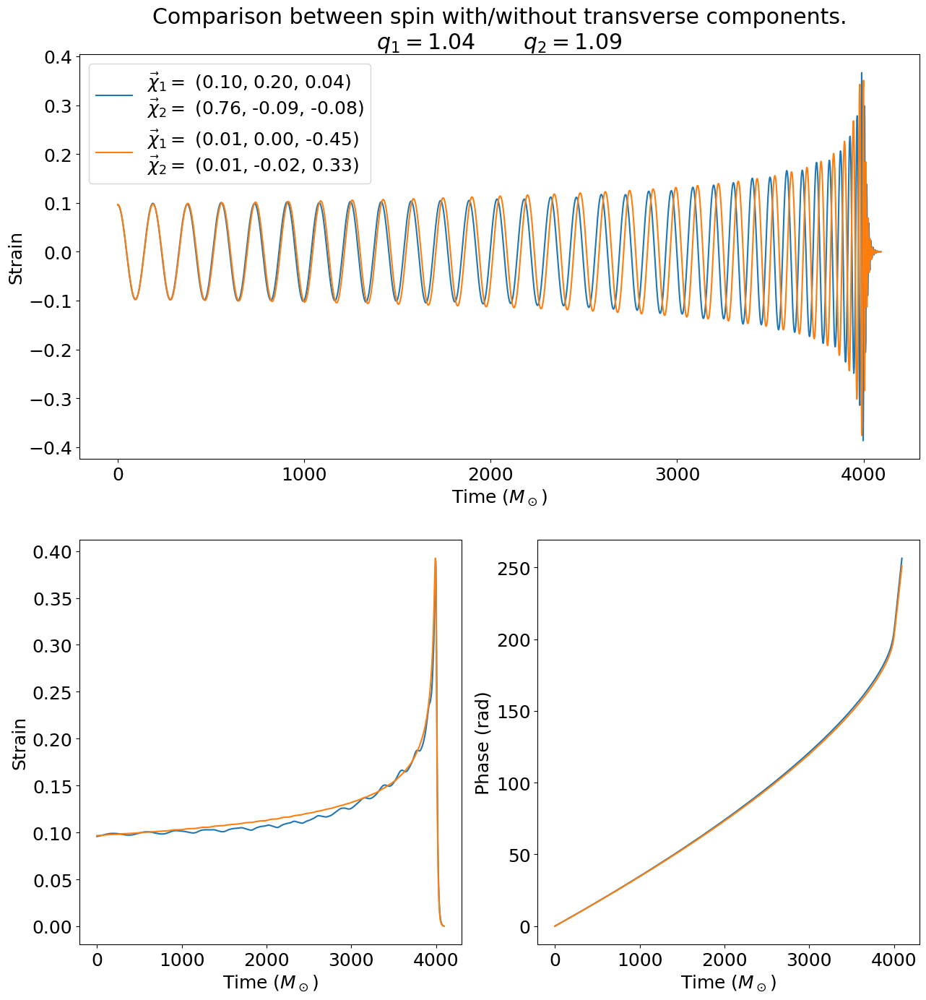

In [19]:
# Code for waveform plot

import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib

matplotlib.rc('font', size=18)

f = h5py.File("/home/nino/GW/data/bbh_qzp_data.hdf5")

wv = f['waveforms'][:]
q = f['parameters'][:, 0]
s1 = f['parameters'][:, [1, 2, 3]]
s2 = f['parameters'][:, [4, 5, 6]]

similar_q_idx = np.where(q<1.1)[0]

# aux_0 = np.argmax(z1[similar_q_idx]-z2[similar_q_idx])
# idx_0 = similar_q_idx[aux_0]
# aux_1 = np.argmin(np.abs(z1[similar_q_idx]-z2[similar_q_idx]))
# idx_1 = similar_q_idx[aux_1]

aux_0 = 0
aux_1 = 8

idx_0 = similar_q_idx[aux_0]
idx_1 = similar_q_idx[aux_1]
wv1 = wv[idx_0]# *1e21
wv2 = wv[idx_1]# *1e21

time_array = np.arange(2048) * 2 # M/samples

gs = gridspec.GridSpec(2, 2)

plt.figure(figsize=(15, 16))

ax = plt.subplot(gs[0, :])
plt.plot(time_array, set_waveform(wv1), label = "$\\vec{\chi}_1 =$"+f" ({s1[idx_0][0]:.2f}, {s1[idx_0][1]:.2f}, {s1[idx_0][2]:.2f})"+"\n$\\vec{\chi}_2 =$"+f" ({s2[idx_0][0]:.2f}, {s2[idx_0][1]:.2f}, {s2[idx_0][2]:.2f})")
plt.plot(time_array, set_waveform(wv2), label = "$\\vec{\chi}_1 =$"+f" ({s1[idx_1][0]:.2f}, {s1[idx_1][1]:.2f}, {s1[idx_1][2]:.2f})"+"\n$\\vec{\chi}_2 =$"+f" ({s2[idx_1][0]:.2f}, {s2[idx_1][1]:.2f}, {s2[idx_1][2]:.2f})")
plt.title(f"Comparison between spin with/without transverse components.\n$q_1={q[idx_0]:.2f}\quad\;\quad q_2={q[idx_1]:.2f}$")
plt.legend()
plt.ylabel("Strain")
plt.xlabel("Time ($M_\odot$)")


ax = plt.subplot(gs[1, 0])

plt.plot(time_array, np.abs(wv1))
plt.plot(time_array, np.abs(wv2))
plt.ylabel("Strain")
plt.xlabel("Time ($M_\odot$)")

ax = plt.subplot(gs[1, 1])

plt.plot(time_array, get_phases(wv1))
plt.plot(time_array, get_phases(wv2))
plt.ylabel("Phase (rad)")
plt.xlabel("Time ($M_\odot$)")

1.177 1.221 667.037 884.364


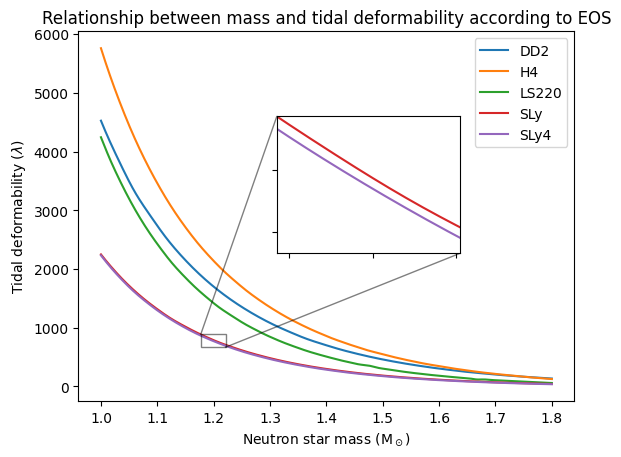

In [ ]:
# code for eos plot

# import numpy as np
# import h5py
# import matplotlib.pyplot as plt

# f = h5py.File("/home/nino/GW/data/data_NS_EOS_03.hdf5")
# data = []

# for eos in f.keys():
#     data.append(np.stack([np.concatenate([f[eos]['mass1'][:], f[eos]['mass2'][:]]), np.concatenate([f[eos]['lampda1'][:], f[eos]['lampda2'][:]])], axis = 1))

# fig, ax = plt.subplots()

# n =20000
# idxs2 = np.argsort(data[-2][:, 0])
# idxs1 = np.argsort(data[-1][:, 0])

# for ct, i in enumerate(f.keys()):
#     idxs = np.argsort(data[ct][:, 0])
#     ax.plot(data[ct][idxs, 0], data[ct][idxs, 1], label = i)
# ax.legend()
# plt.title("Relationship between mass and tidal deformability according to EOS")
# plt.ylabel("Tidal deformability ($\lambda$)")
# plt.xlabel("Neutron star mass (M$_\odot$)")

# # inset axes....
# x1, x2, y1, y2 = data[-2][idxs2[4500], 0], data[-1][idxs1[5500], 0], data[-1][idxs2[4500], 1], data[-2][idxs1[4000], 1]
# print(x1, x2, y1, y2)  # subregion of the original image
# axins = ax.inset_axes(
#     [0.4, 0.4, 0.37, 0.37],
#     xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])
# axins.plot(data[-2][idxs2[:n], 0], data[-2][idxs2[:n], 1], color = '#d62728')
# axins.plot(data[-1][idxs1[:n], 0], data[-1][idxs1[:n], 1], color = '#9467bd')

# ax.indicate_inset_zoom(axins, edgecolor="black")

# plt.show()

In [ ]:
import h5py
f = h5py.File("/home/nino/GW/data/bns_mass_lbd.hdf")

print(f['waveforms'])
print(f['waveforms'].attrs.keys())
print(f['parameters'])
print(f['parameters'].attrs.keys())
M_sun = 1.9885e30
c = 299792458
G = 6.67430e-11

# In order to get the same sampling rate as the BBH datasets:

delta_t_seconds = 2*G*M_sun/(c**3)


<HDF5 dataset "waveforms": shape (50000, 4096), type "<c16">
<KeysViewHDF5 ['delta_t_seconds']>
<HDF5 dataset "parameters": shape (50000, 4), type "<f8">
<KeysViewHDF5 ['names']>


In [ ]:
import numpy as np
M_sun = 1.9885e30
c = 299792458
G = 6.67430e-11
pc_to_meters = 3.08567758128e+16 # m/pc
Mpc_to_meters = pc_to_meters/10e6

G*M_sun/(c**3)

def meters_to_solar_masses(d_m):
    solar_m_ovr_meters = (c**2)/(G*M_sun)
    return d_m*solar_m_ovr_meters

def solar_masses_to_meters(d_sm):
    meters_ovr_solar_m = (G*M_sun)/(c**2)
    return d_sm*meters_ovr_solar_m

def seconds_to_solar_masses(t_s):
    solar_m_ovr_seconds = (c**3)/(G*M_sun)
    return t_s*solar_m_ovr_seconds

def solar_masses_to_seconds(t_sm):
    seconds_ovr_solar_m = G*M_sun/(c**3)
    return t_sm*seconds_ovr_solar_m

In [ ]:
1/seconds_to_solar_masses(1/2**17)

0.6456232125364919

In [ ]:
100*Mpc_to_meters

308567758128.0

In [ ]:
amp = max(np.real(f['waveforms'][0]*1e-21))
total_m = sum(f['parameters'][0,:2])*M_sun

/home/nino/miniconda3/envs/Tensorflow/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


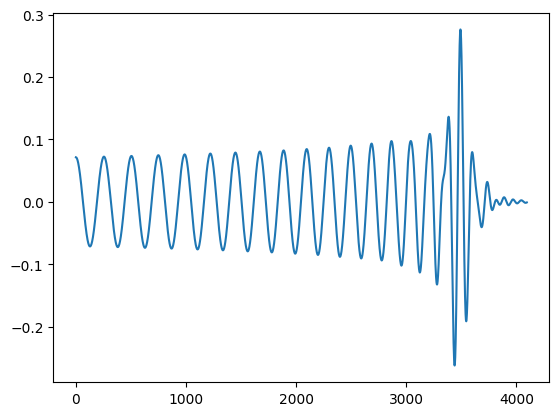

In [ ]:
import matplotlib.pyplot as plt

plt.plot(f['waveforms'][0])

In [ ]:
import h5py

f_og = h5py.File("/home/nino/GW/data/bns_mass_lbd.hdf")

with h5py.File("/home/nino/GW/data/bns_mass_lbd_prime.hdf", 'w') as f:
    f.create_dataset("waveforms", data=f_og['waveforms'][:]*1e21)
    f["waveforms"].attrs['delta_t_seconds'] = 1/2**17
    f.create_dataset("parameters", data = f_og['parameters'][:])
    f['parameters'].attrs['names'] = f_og['parameters'].attrs['names']


In [ ]:
import h5py

f = h5py.File("/home/nino/GW/data/sxs_waves.h5")
params = {'mass1' : [], 'mass2' : [], "mass_ratio" : [], "sp1x" : [], "sp1y" : [], "sp1z" : [], "sp2x" : [], "sp2y" : [], "sp2z" : []}

for key in f.keys():
    try:
        meta = f[key]['metadata']
        params["mass1"].append(meta['mass1'][()])
        params["mass2"].append(meta['mass2'][()])
        params["mass_ratio"].append(meta['mass_ratio'][()])
        params["sp1x"].append(meta["dimensionless_spin1"]['0'][()])
        params["sp1y"].append(meta["dimensionless_spin1"]['1'][()])
        params["sp1z"].append(meta["dimensionless_spin1"]['2'][()])
        params["sp2x"].append(meta["dimensionless_spin2"]['0'][()])
        params["sp2y"].append(meta["dimensionless_spin2"]['1'][()])
        params["sp2z"].append(meta["dimensionless_spin2"]['2'][()])
    except:
        print(f"Unable to find {key} metadata. Skipping...")

Unable to find BFI:G268556_002 metadata. Skipping...
Unable to find BFI:G268556_003 metadata. Skipping...


In [3]:
from pycbc.filter import overlap, match
from gwpy.timeseries import TimeSeries as gwpy_ts
from copy import deepcopy
import numpy as np


def pycbc_mismatch(x,y):
    x = gwpy_ts(x.astype(float)).to_pycbc()
    y = gwpy_ts(y.astype(float)).to_pycbc()
    return 1 - match(x,y)[0]

def crop_hp_hc(hp, hc, margin_0, total_length):
    margin = deepcopy(margin_0)

    maxx = np.argmax(hp)
    hp_wv = hp[maxx-total_length+margin:maxx+margin]
    hc_wv = hc[maxx-total_length+margin:maxx+margin]
    lens_aux_amp = len(hp_wv)


    if lens_aux_amp != total_length:
        margin = len(hp) - maxx
        hp_wv = hp[maxx-total_length+margin:maxx+margin]
        hc_wv = hc[maxx-total_length+margin:maxx+margin]
        margin = margin_0

    return hp_wv, hc_wv

def unwrap_phase(complex_array):
    phase = np.angle(complex_array)
    unwrapped_phase = np.unwrap(phase)
    return unwrapped_phase

def get_phase(elem):
    out = unwrap_phase(elem)
    out = out-out[0]
    return out.astype(float)

def process_data(hp, hc, margin, total):
    crop = crop_hp_hc(hp, hc, margin, total)
    waveform = crop[0] + 1j*crop[1]
    amp = np.abs(waveform)
    phase = get_phase(waveform)
    return amp*np.cos(phase), amp*np.sin(phase)

def plot_performance(y_pred, y_true, pycbc = False):
    mm_score = []

    from tqdm import tqdm

    if pycbc:
        for wf, st in tqdm(zip(y_pred, y_true), total = len(y_pred), desc = 'PyCBC Overlap'):
            mm_score.append(pycbc_mismatch(wf, st))
    else:
        for wf, st in tqdm(zip(y_pred, y_true), total = len(y_pred), desc = 'Homemade mismatch'):
            mm_score.append(mismatch(wf, st))

    plt.hist(np.log10(mm_score), bins = 40, range = (min(np.log10(mm_score))-0.5, max(np.log10(mm_score))+0.5))
    plt.title('Mean: ' + str(np.mean(mm_score)))
    plt.ylabel('Count')
    plt.xlabel('$\log_{10}$ mismatch')

    mm_score = np.array(mm_score)
    args = np.argsort(mm_score)
    best_scores = mm_score[args][-4:]
    worst_scores = mm_score[args][:4]

    good_idx = [ct for ct, i in enumerate(mm_score) if i in best_scores]
    bad_idx = [ct for ct, i in enumerate(mm_score) if i in worst_scores]

    fig, ax = plt.subplots(2, 4)

    idx = good_idx[:4] + bad_idx[:4]

    ax[0, 0].plot(y_true[idx[0]], label = 'Original')
    ax[0, 0].plot(y_pred[idx[0]], label = 'Predicted')
    ax[0, 0].title.set_text('Mismatch: ' + str(mm_score[idx[0]]))
    ax[0, 0].legend()

    ax[0, 1].plot(y_true[idx[1]])
    ax[0, 1].plot(y_pred[idx[1]])
    ax[0, 1].title.set_text('Mismatch: ' + str(mm_score[idx[1]]))

    ax[0, 2].plot(y_true[idx[2]])
    ax[0, 2].plot(y_pred[idx[2]])
    ax[0, 2].title.set_text('Mismatch: ' + str(mm_score[idx[2]]))

    ax[0, 3].plot(y_true[idx[3]])
    ax[0, 3].plot(y_pred[idx[3]])
    ax[0, 3].title.set_text('Mismatch: ' + str(mm_score[idx[3]]))

    ax[1, 0].plot(y_true[idx[4]])
    ax[1, 0].plot(y_pred[idx[4]])
    ax[1, 0].title.set_text('Mismatch: ' + str(mm_score[idx[4]]))

    ax[1, 1].plot(y_true[idx[5]])
    ax[1, 1].plot(y_pred[idx[5]])
    ax[1, 1].title.set_text('Mismatch: ' + str(mm_score[idx[5]]))

    ax[1, 2].plot(y_true[idx[6]])
    ax[1, 2].plot(y_pred[idx[6]])
    ax[1, 2].title.set_text('Mismatch: ' + str(mm_score[idx[6]]))

    ax[1, 3].plot(y_true[idx[7]])
    ax[1, 3].plot(y_pred[idx[7]])
    ax[1, 3].title.set_text('Mismatch: ' + str(mm_score[idx[7]]))

    fig.set_size_inches(20, 9.5)

    return mm_score, good_idx, bad_idx

In [4]:

from tqdm import tqdm
import gwsurrogate
import h5py

f = h5py.File("/home/nino/GW/data/sxs_clean.h5")

sur = gwsurrogate.LoadSurrogate('NRSur7dq4')

delta_t = 2
margin = 500
total = 2048
f_low = 0

sur_data = []
sxs_data = []

for pars in tqdm(f['parameters'][:]):
    
    q, s1x, s1y, s1z, s2x, s2y, s2z = pars
    _, h, _ = sur(q, [s1x, s1y, s1z], [s2x, s2y, s2z], dt=delta_t, f_low=f_low)
    proc = process_data(np.real(h[(2, 2)]), np.imag(h[(2, 2)]), margin, total)
    
    sur_data.append(proc[0] + 1j*proc[1])

sur_data = np.array(sur_data)
sxs_data = f['waveforms'][:]
    


Loaded NRSur7dq4 model


1309it [02:35,  8.41it/s]                    


In [7]:
from h5py import File
from utils.plot_utils import plot_waveform_comparison, get_percentile_index, pycbc_mismatch
from joblib import dump
import matplotlib
import matplotlib.pyplot as plt
import os

f = File("/home/nino/GW/data/sxs_clean.h5")

delta_t_seconds = f['waveforms'].attrs['delta_t_seconds']

save_dir = "/home/nino/GW/Keras-Project-Template/figures/nrsurr"

if not os.path.isdir(save_dir):
    os.mkdir(save_dir)

mm, bst, wrst = pycbc_mismatch(sur_data, sxs_data, delta_t_seconds)

dump(mm, os.path.join(save_dir, "mismatches.bin"))

perc_10 = get_percentile_index(mm, 0.9)
perc_50 = get_percentile_index(mm, 0.5)


matplotlib.rc('font', size=16)
plt.rcParams["figure.figsize"] = (10,7)

bins = np.logspace(np.log10(min(mm)), np.log10(max(mm)), num=30)
_ = plt.hist(mm, bins = bins)
plt.grid(True, which="both", axis="both", linestyle='-', color='gray', linewidth=0.5, alpha = 0.7)
plt.xscale('log')
plt.title(f'Mean mismatch: {np.mean(mm):3e}')
plt.ylabel('Count')
plt.xlabel(f'Mismatch')
plt.savefig(os.path.join(save_dir, "mismatch_histogram.png"))
plt.clf()

plot_waveform_comparison(sur_data[bst], sxs_data[bst], delta_t_seconds, save_dir, title = f"Best case. Mismatch: {mm[bst]:.3e}", save_name = "best_waveform.jpg")
plot_waveform_comparison(sur_data[wrst], sxs_data[wrst], delta_t_seconds, save_dir, title = f"Worst case. Mismatch: {mm[wrst]:.3e}", save_name = "worst_waveform.jpg")
plot_waveform_comparison(sur_data[perc_10], sxs_data[perc_10], delta_t_seconds, save_dir, title = f"10th percentile waveform. Mismatch: {mm[perc_10]:.3e}", save_name = "perc_10_waveform.jpg")
plot_waveform_comparison(sur_data[perc_50], sxs_data[perc_50], delta_t_seconds, save_dir, title = f"50th percentile waveform. Mismatch: {mm[perc_50]:.3e}", save_name = "perc_50_waveform.jpg")

Calculating mismatches: 100%|██████████| 1309/1309 [00:19<00:00, 67.44it/s]
/home/nino/miniconda3/envs/gw_surrogate/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/nino/miniconda3/envs/gw_surrogate/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/nino/miniconda3/envs/gw_surrogate/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/nino/miniconda3/envs/gw_surrogate/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


<Figure size 1000x700 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

a = np.random.exponential(size = 100)
b = np.random.exponential(size = 100)
c = np.random.exponential(size = 100)

data = [a, b, c]

Text(0.5, 0, 'Mismatch')

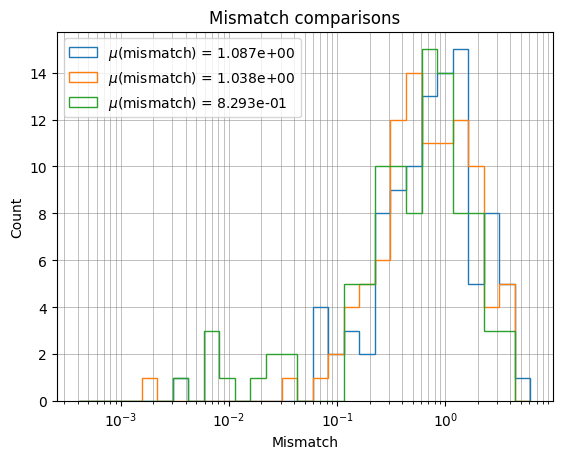

In [ ]:

bins = np.logspace(np.log10(min([min(vec) for vec in data])), np.log10(max([max(vec) for vec in data])), num=30)

for sc in data:
    _ = plt.hist(sc, bins = bins, histtype='step', label = f"$\mu$ = {np.mean(sc):.3e}")

plt.legend()
plt.grid(True, which="both", axis="both", linestyle='-', color='gray', linewidth=0.5, alpha = 0.7)
plt.xscale('log')
plt.title('Mismatch comparisons')
plt.ylabel('Count')
plt.xlabel('Mismatch')

# Mismatch comparison plot chunk

In [16]:
from utils.plot_utils import plot_mismatch_comparison
from joblib import load

mm_reg_tr = load("/home/nino/GW/Keras-Project-Template/figures/reg_qzp_bbh_good/mismatches_train.bin")
mm_reg_ts = load("/home/nino/GW/Keras-Project-Template/figures/reg_qzp_bbh_good/mismatches_test.bin")

mm_cvae_tr = load("/home/nino/GW/Keras-Project-Template/figures/cvae_qzp/mean_train_mismatches.bin")
mm_cvae_ts = load("/home/nino/GW/Keras-Project-Template/figures/cvae_qzp/mean_test_mismatches.bin")

data_dict_tr = {'Reg' : mm_reg_tr,
                'cVAE' : mm_cvae_tr
                }
data_dict_ts = {'Reg' : mm_reg_ts,
                'cVAE' : mm_cvae_ts
                }

plot_mismatch_comparison("/home/nino/GW/Keras-Project-Template/figures/reg_cvae_mm_train_comparison", data_dict_tr, "Train")
plot_mismatch_comparison("/home/nino/GW/Keras-Project-Template/figures/reg_cvae_mm_test_comparison", data_dict_ts, "Test")

<Figure size 900x600 with 0 Axes>

In [8]:
from utils.plot_utils import plot_mismatch_comparison
from joblib import load

mm_reg_ts = load("/home/nino/GW/Keras-Project-Template/figures/reg_tl_sxs/mismatches_test.bin")
mm_cvae_ts = load("/home/nino/GW/Keras-Project-Template/figures/cvae_sxs/mismatches_test.bin")
mm_nsur = load("/home/nino/GW/Keras-Project-Template/figures/nrsurr/mismatches.bin")

data_dict_ts = {'Reg' : mm_reg_ts,
                'cVAE' : mm_cvae_ts,
                'NRSur7dq4' : mm_nsur
                }

plot_mismatch_comparison("/home/nino/GW/Keras-Project-Template/figures/sxs_mm_w_sur_test_comparison", data_dict_ts, "Test")

<Figure size 900x600 with 0 Axes>

In [ ]:
for data in data_dict_ts:
    print(data)

Regularized autoenconder model
Mapped autoencoder model
Dense model


In [ ]:
M_sun = 1.9885e30
c = 299792458
G = 6.67430e-11

# In order to get the same sampling rate as the BBH datasets:

delta_t_seconds = 2*G*M_sun/(c**3)

mismatches, best_idx, worst_idx = pycbc_mismatch(sur_data, sxs_data, delta_t_seconds)

TypeError: pycbc_mismatch() takes 2 positional arguments but 3 were given

In [ ]:
import sys
sys.path.append("/home/nino/GW/Keras-Project-Template/utils")
from utils.plot_utils import make_plots

make_plots(sur_data, sxs_data, "/home/nino/GW/Keras-Project-Template/figures/test", delta_t_seconds)

Calculating mismatches: 100%|██████████| 1314/1314 [00:37<00:00, 35.12it/s]


/home/nino/miniconda3/envs/gw_surrogate/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
from IPython.display import clear_output

for i in range(580, 640):

    wv = f[list(f.keys())[i]]['waveform'][:]
    sxs_proc = process_data(np.real(wv), np.imag(wv), margin, total)
    plt.plot(sxs_proc[0]) 
    plt.title(list(f.keys())[i])
    plt.show()
    input("")

    clear_output()

PyCBC Overlap:   0%|          | 0/1314 [00:00<?, ?it/s]/tmp/ipykernel_2102671/2919105187.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  x = gwpy_ts(x.astype(float)).to_pycbc()
/tmp/ipykernel_2102671/2919105187.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  y = gwpy_ts(y.astype(float)).to_pycbc()
PyCBC Overlap: 100%|██████████| 1314/1314 [00:49<00:00, 26.42it/s]
/home/nino/miniconda3/envs/gw_surrogate/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


(array([0.02701304, 0.00219005, 0.0107855 , ..., 0.00342022,
        0.00450966, 0.00181566]),
 [674, 675, 676, 678],
 [601, 631, 654, 684])

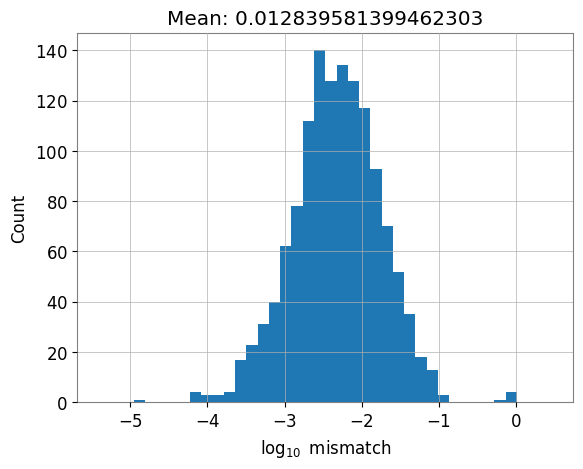

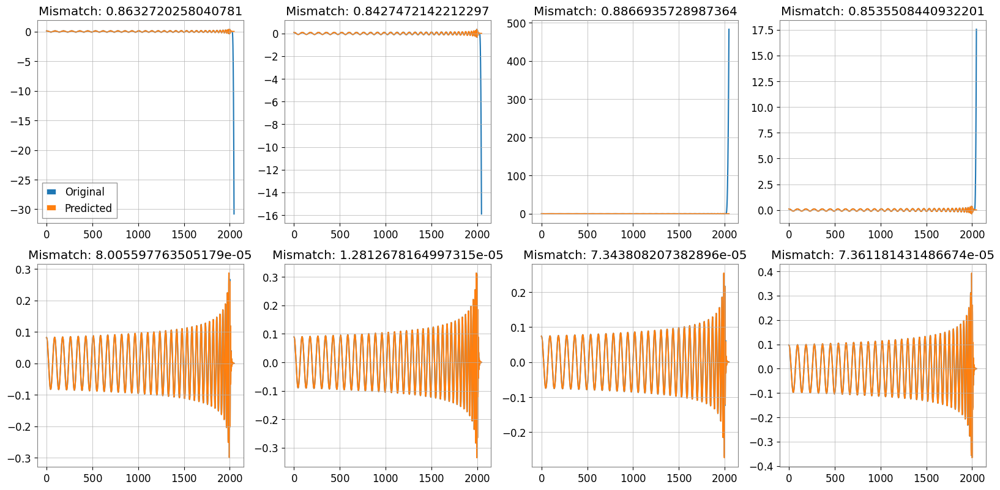

In [ ]:
plot_performance(sur_data, sxs_data, pycbc=True)

In [ ]:
sxs_hp_raw = np.real(f['BFI:170608:005']['waveform'][:])
sxs_hc_raw = np.imag(f['BFI:170608:005']['waveform'][:])
sur_hp_raw = np.real(h)
sur_hc_raw = np.imag(h)
sur_hp_raw_modes = np.real(h_modes[(2, 2)])
sur_hc_raw_modes = np.imag(h_modes[(2, 2)])

sur_hp, sur_hc = process_data(sur_hp_raw, sur_hc_raw, margin, total)
sxs_hp, sxs_hc = process_data(sxs_hp_raw, sxs_hc_raw, margin, total)
sur_hp_22, sur_hc_22 = process_data(sur_hp_raw_modes, sur_hc_raw_modes, margin, total)

pycbc_mismatch(sur_hp_22, sxs_hp)

0.02701273164606932

In [ ]:
import h5py

f_sxs = h5py.File("/home/nino/GW/data/sxs_augmented.h5")

M_sun = 1.9885e30
c = 299792458
G = 6.67430e-11

# In order to get the same sampling rate as the BBH datasets:

delta_t_seconds = 2*G*M_sun/(c**3)

In [ ]:
f_sxs.keys()

<KeysViewHDF5 ['surrogate', 'sxs']>

In [ ]:
with h5py.File("/home/nino/GW/data/sxs_augmented_p.h5", "w") as f:
    sxs = f.create_group("sxs")
    sxs.create_dataset("waveforms", data = f_sxs['sxs']['waveforms'])
    sxs["waveforms"].attrs['delta_t_seconds'] = delta_t_seconds
    sxs.create_dataset("parameters", data = f_sxs['sxs']['parameters'])
    sxs["parameters"].attrs["names"] = "mass_ratio, spin1 (x, y, z), spin2 (x, y, z)"

    sur = f.create_group("surrogate")
    sur.create_dataset("waveforms", data = f_sxs['surrogate']['waveforms'])
    sur['waveforms'].attrs['delta_t_seconds'] = delta_t_seconds
    sur.create_dataset("parameters", data = f_sxs['surrogate']['parameters'])
    sur["parameters"].attrs["names"] = "mass_ratio, spin1 (x, y, z), spin2 (x, y, z)"

# Mapper detail

In [ ]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=2**13)])
  except RuntimeError as e:
    print(e)

2024-04-23 07:07:54.062183: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-23 07:07:54.230981: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-23 07:07:55.115759: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/nino/miniconda3/envs/Tensorflow/lib/
2024-04-23 07:07:55.115841: W tensorflow/co

In [ ]:
(2**13)+(2**11)

10240

In [ ]:
import os
import data_loader.gw_dataloader as data_loader_module
from models.parametric_umap import ParametricUMAP
from models.gw_models import RegularizedAutoEncoder
from utils.config import process_config, init_obj

os.environ['CUDA_VISIBLE_DEVICES']=''

model_dir = "/home/nino/GW/Keras-Project-Template/experiments/2024-04-22_21-48-49/reg_ae_sxs/checkpoints"
emb_path = "/home/nino/GW/Keras-Project-Template/experiments/2024-04-22_21-48-49/reg_ae_sxs/checkpoints/best_embedder.hdf5"
ae_path = "/home/nino/GW/Keras-Project-Template/experiments/2024-04-22_21-48-49/reg_ae_sxs/checkpoints/best_autoencoder.hdf5"

config, _ = process_config(os.path.join(model_dir, "config.json"))
data_loader = init_obj(config, "data_loader", data_loader_module)

emb = ParametricUMAP(config, data_loader)
ae = RegularizedAutoEncoder(config, data_loader.in_out_shapes['output_shape'])

2024-04-23 15:40:26.390770: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-23 15:40:26.578555: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-23 15:40:27.386163: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/nino/miniconda3/envs/Tensorflow/lib/
2024-04-23 15:40:27.386249: W tensorflow/co



Computing nearest neighbors for parametric UMAP


Tue Apr 23 15:41:02 2024 Building RP forest with 19 trees
Tue Apr 23 15:41:07 2024 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations


In [ ]:
emb.parametric_model.load_weights(emb_path)
ae.autoencoder.load_weights(ae_path)
data_loader.add_umap_data(emb.embedder.predict(data_loader.X_train, batch_size = 1024, verbose = 0), emb.embedder.predict(data_loader.X_test, batch_size = 1024, verbose = 0))
data_loader.add_latent_data(ae.encoder.predict(data_loader.y_train, batch_size = 1024, verbose = 0), ae.encoder.predict(data_loader.y_test, batch_size = 1024, verbose = 0))

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(n_estimators = 300, min_samples_split = 10, verbose=1)
rfr.fit(data_loader.umap_train, data_loader.latent_train)


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:  5.1min


RandomForestRegressor(min_samples_split=10, n_estimators=300, verbose=1)

In [ ]:
y_pred_train = ae.decoder.predict(rfr.predict(emb.embedder.predict(data_loader.X_train, batch_size = 512)), batch_size = 512)
y_pred_test = ae.decoder.predict(rfr.predict(emb.embedder.predict(data_loader.X_test, batch_size = 512)), batch_size = 512)

159/159 [==============================] - 1s 9ms/step


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    5.5s


40/40 [==============================] - 0s 8ms/step


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    1.7s


40/40 [==============================] - 53s 1s/step


TypeError: RegressorMixin.score() missing 2 required positional arguments: 'X' and 'y'

In [ ]:
from utils.plot_utils import make_plots

make_plots(y_pred_test, data_loader.y_test, "/home/nino/GW/Keras-Project-Template/figures/rfr/test", data_loader.delta_t)

Calculating mismatches: 100%|██████████| 20263/20263 [04:12<00:00, 80.14it/s] 


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
make_plots(y_pred_train, data_loader.y_train, "/home/nino/GW/Keras-Project-Template/figures/rfr/train", data_loader.delta_t)

Calculating mismatches: 100%|██████████| 81051/81051 [02:28<00:00, 544.88it/s] 


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = []
callbacks.append(EarlyStopping(monitor = 'val_loss', patience = config.callbacks.early_stopping_patience))
callbacks.append(ReduceLROnPlateau(monitor = 'loss', factor = config.callbacks.lr_reduce_factor, patience = config.callbacks.lr_reduce_patience))

In [ ]:
hist_ae.keys()

dict_keys(['loss', 'encoding_loss', 'reconstruction_loss', 'val_loss', 'val_encoding_loss', 'val_reconstruction_loss', 'lr'])

In [ ]:
import matplotlib.pyplot as plt
from joblib import load

hist_ae = load("/home/nino/GW/Keras-Project-Template/experiments/2024-04-21_16-22-35/reg_ae_sxs/checkpoints/history_autoencoder.bin")

fig, ax = plt.subplots(1, 2)

ax[0].plot(hist_ae['reconstruction_loss'])
ax[1].plot(hist_ae['encoding_loss'])

FileNotFoundError: [Errno 2] No such file or directory: '/home/nino/GW/Keras-Project-Template/experiments/2024-04-21_16-22-35/reg_ae_sxs/checkpoints/history_autoencoder.bin'

In [ ]:
inp = keras.Input(input_output_shape)

y = ConvBlock1D(config, input_output_shape).conv_block(inp)
out_line = layers.Add()([inp, y])

y = ConvBlock1D(config, input_output_shape).conv_block(out_line)
out_line = layers.Add()([out_line, y])

In [ ]:
import keras
from keras.optimizers import Adam, Nadam
from keras import layers
from models.gw_latent_mappers import ConvBlock1D
input_output_shape = config.model.latent_dim


inp = keras.Input(input_output_shape)

y1 = ConvBlock1D(config, input_output_shape).conv_block(inp)
x1 = layers.Add()([inp, y1])

y2 = ConvBlock1D(config, input_output_shape).conv_block(x1)
x2 = layers.Add()([inp, y1, y2])

y3 = ConvBlock1D(config, input_output_shape).conv_block(x2)
x3 = layers.Add()([inp, y1, y2, y3])

y4 = ConvBlock1D(config, input_output_shape).conv_block(x3)
x4 = layers.Add()([inp, y1, y2, y3, y4])

y5 = ConvBlock1D(config, input_output_shape).conv_block(x4)
x5 = layers.Add()([inp, y1, y2, y3, y4, y5])

y6 = ConvBlock1D(config, input_output_shape).conv_block(x5)
opt = layers.Add()([inp, y1, y2, y3, y4, y5, y6])

mapper = keras.Model(inp, opt)

optimizer = Nadam(learning_rate = 0.0005, clipnorm = 0.1, clipvalue=0.1)


mapper.compile(loss = 'mae', optimizer = optimizer)
history_mapper = mapper.fit(
            data_loader.get_mapper_train_data(),
            validation_data = data_loader.get_mapper_test_data(),
            epochs=config.trainer.mapper_epochs,
            verbose=1,
            batch_size=128,
            callbacks=callbacks
        )

Epoch 1/10000
634/634 [==============================] - 38s 45ms/step - loss: 0.6689 - val_loss: 0.4190 - lr: 5.0000e-04
Epoch 2/10000
634/634 [==============================] - 28s 43ms/step - loss: 0.3954 - val_loss: 0.3733 - lr: 5.0000e-04
Epoch 3/10000
634/634 [==============================] - 28s 44ms/step - loss: 0.3519 - val_loss: 0.3445 - lr: 5.0000e-04
Epoch 4/10000
634/634 [==============================] - 28s 44ms/step - loss: 0.3359 - val_loss: 0.3267 - lr: 5.0000e-04
Epoch 5/10000
634/634 [==============================] - 28s 44ms/step - loss: 0.3285 - val_loss: 0.3234 - lr: 5.0000e-04
Epoch 6/10000
272/634 [===========>..................] - ETA: 15s - loss: 0.3232

KeyboardInterrupt: 

In [ ]:
import h5py
import pandas as pd

f = h5py.File("/home/nino/GW/data/bns_mass_lbd.hdf")
pars = pd.DataFrame(f['parameters'][:])

In [ ]:
import numpy as np

eos_labels = ["DD2" for _ in range(10000)] + ["H4" for _ in range(10000)] + ["LS220" for _ in range(10000)] + ["SLy" for _ in range(10000)] + ["SLy4" for _ in range(10000)]
type(eos_labels[0])

str

In [ ]:
from sklearn.utils import shuffle

wv, pars, eos_lb = shuffle(f["waveforms"][:], f["parameters"][:], eos_labels, random_state=37)

In [ ]:
type(eos_lb[0])

str

In [ ]:
with h5py.File("/home/nino/GW/data/bns_mass_lbd_prime.hdf", "w") as f_new:
    f_new.create_dataset("waveforms", data = wv)
    f_new["waveforms"].attrs["delta_t_seconds"] = f["waveforms"].attrs["delta_t_seconds"]
    f_new.create_dataset("parameters", data = pars)
    f_new["parameters"].attrs["names"] = f["parameters"].attrs["names"]
    f_new.create_dataset("eos_names", data=eos_lb)